In [116]:
#关闭警告信息
import warnings
warnings.filterwarnings('ignore')

读取数据并对数据进行必要的检查，包括缺失值、数据类型。

In [2]:
#读取数据
import pandas as pd
Data=pd.read_pickle('DNA methylation data/RA DNA methylation/RA_Methylation_Data.pkl')
Data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 6425 entries, 7462 to 7002
Columns: 100008 entries, sample_id to DiseaseEncoder
dtypes: float64(100002), int64(2), object(4)
memory usage: 4.8+ GB


In [3]:
#检查数据空缺值
print(Data.isnull().sum().sum())

136


In [5]:
#处理空缺数据
Data['gender'].fillna('M',inplace=True)
Data['GenderEncoder'].fillna(0,inplace=True)

In [6]:
#检查空缺数据处理结果
print(Data.isnull().sum().sum())

0


In [7]:
#查看数据结构
Data.head(10)

,sample_id,cg00050873,cg00212031,cg00213748,cg00214611,cg00455876,cg01707559,cg02004872,cg02011394,cg02050847,...,cg12794168,cg12799119,cg12848808,age,gender,sample_type,disease,GenderEncoder,sample_type_encoder,DiseaseEncoder
7462,train17463,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,1.482415,-3.938986,-1.687774,39.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7463,train17464,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.890330,-3.619579,-1.672671,28.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7464,train17465,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,2.049755,-3.886935,-2.100192,68.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7465,train17466,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.832866,-4.112908,-2.324893,30.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7466,train17467,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,1.564056,-3.701353,-1.814692,69.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7467,train17468,1.687774,-4.247583,0.0,-3.744756,0.0,-2.185284,-3.314031,2.570129,3.744756,...,1.482415,-3.580953,-1.982282,40.0,M,disease tissue,rheumatoid arthritis,0.0,1,1
7468,train17469,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,1.247949,-3.886935,-2.069693,47.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7469,train17470,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,1.790011,-4.051632,-1.918093,53.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7470,train17471,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,1.348848,-4.051632,-1.936120,62.0,F,disease tissue,rheumatoid arthritis,1.0,1,1
7471,train17472,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,1.300641,-4.322159,-1.848299,49.0,F,disease tissue,rheumatoid arthritis,1.0,1,1


使用PCA算法计算保留95%和99%信息的维度，并将数据降维至3维可视化数据分布。

In [9]:
#提取甲基化数据并进行PCA处理
Methylation=Data.iloc[:,1:-7]
print(Methylation.shape)

(6425, 100000)


In [8]:
#执行PCA算法-计算保留99%信息时的维度
from sklearn.decomposition import PCA
Methylaion_PCA=PCA(n_components=0.99)
PCA_Methylation_99=Methylaion_PCA.fit_transform(Methylation)    #数据降维
print(PCA_Methylation_99.shape)

(6425, 3981)


In [8]:
#执行PCA算法-计算保留99%信息时的维度
from sklearn.decomposition import PCA
Methylaion_PCA=PCA(n_components=0.95)
PCA_Methylation_95=Methylaion_PCA.fit_transform(Methylation)    #数据降维
print(PCA_Methylation_95.shape)

(6425, 2514)


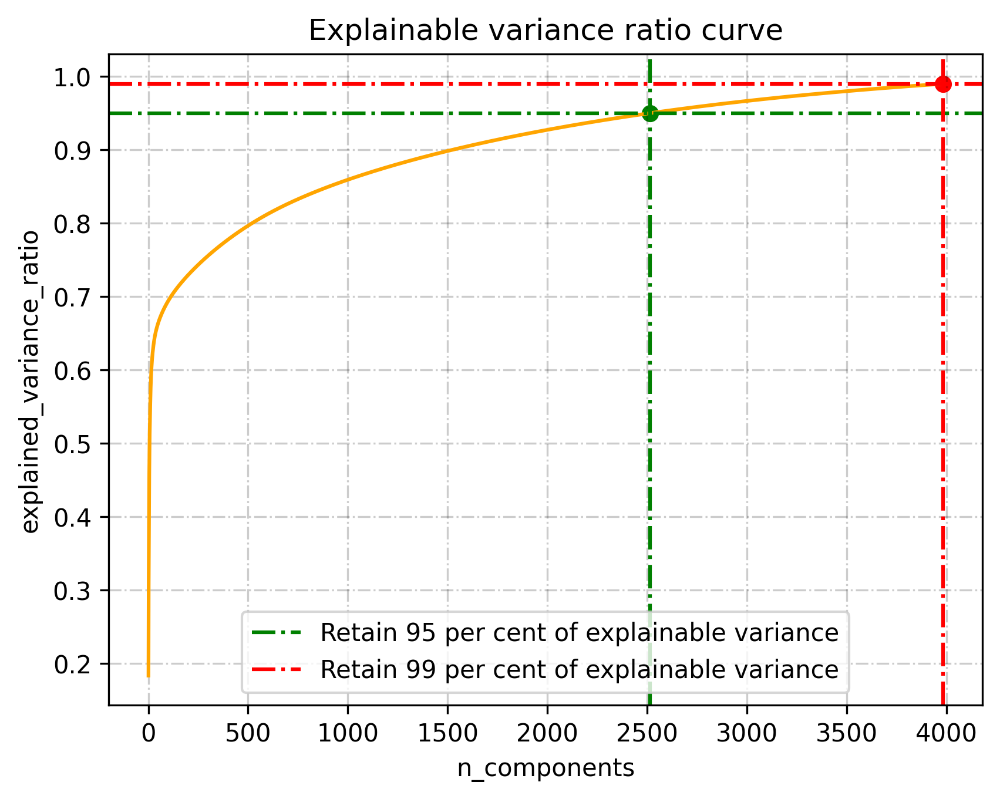

In [9]:
#计算可解释方差比
import numpy as np
import matplotlib.pyplot as plt
Explain_variance=np.cumsum(Methylaion_PCA.explained_variance_ratio_)
#绘图
Explain_variance_plt=plt.figure(dpi=300)
Epl_variance=Explain_variance_plt.add_subplot(111)
Epl_variance.set_title('Explainable variance ratio curve')
Epl_variance.grid(color='black',linestyle='-.',alpha=0.2)
Epl_variance.plot(np.arange(1,len(Explain_variance)+1,1,dtype=int),Explain_variance,color='orange',linestyle='-')
#添加95%可解释方差曲线
Epl_variance.scatter(x=2514,y=0.95,color='green',marker='o')
Epl_variance.axhline(y=0.95, color='green', linestyle='-.')
Epl_variance.axvline(x=2514, color='green', linestyle='-.', label='Retain 95 per cent of explainable variance')
#添加99%可解释方差曲线
Epl_variance.scatter(3981,0.99,color='red',marker='o')
Epl_variance.axhline(y=0.99, color='red', linestyle='-.')
Epl_variance.axvline(x=3981, color='red', linestyle='-.', label='Retain 99 per cent of explainable variance')
Epl_variance.set_xlabel('n_components')
Epl_variance.set_ylabel('explained_variance_ratio')
plt.legend()
plt.show()

特征选择：执行低方差过滤、高相关过滤和Lossa回归进行特征选择。

In [10]:
#对数据采取低方差过滤算法
from pandas import DataFrame
from sklearn.feature_selection import VarianceThreshold
Variance_Selector=VarianceThreshold(threshold=0.5)
VarSele_Data=Variance_Selector.fit_transform(Methylation)    #执行低方差过滤
VarSele_Data=DataFrame(VarSele_Data)
VarSele_Data.columns=Variance_Selector.get_feature_names_out()
VarSele_Data.shape

(6425, 63403)

In [11]:
#构建特征方差数据
VarianseData=DataFrame()
VarianseData['MetaBolite']=Variance_Selector.feature_names_in_
VarianseData['Variances']=Variance_Selector.variances_
VarianseData.shape

(100000, 2)

In [12]:
#输出为Eecel文件
VarianseData.to_excel('/mnt/workspace/Analysis Data/VarianseData.xlsx','UTF-8')

In [13]:
#执行基于F分布的方差分析进行高相关过滤
from sklearn.feature_selection import SelectKBest, f_classif
Selectk=SelectKBest(score_func=f_classif,k=3981)    #保留99%可解释信息
FselectorData=Selectk.fit_transform(VarSele_Data,Data.loc[:,'DiseaseEncoder'])
FselectorData=pd.DataFrame(FselectorData)
feature_nameindex=Selectk.get_support(indices=True)    #获取特征索引
feature_names=VarSele_Data.columns    #获取特征名
Kfeature_names=[feature_names[i] for i in feature_nameindex]
FselectorData.columns=Kfeature_names
FselectorData.shape

(6425, 3981)

In [14]:
#获取相关系数信息
KBestF_info=DataFrame()
KBestF_info['Feature']=Kfeature_names    #载入特征
KBestF_info['scores']=Selectk.scores_[:3981]
KBestF_info['P value']=Selectk.pvalues_[:3981]
KBestF_info.shape

(3981, 3)

In [15]:
#输出相关系数数据
KBestF_info.to_excel('/mnt/workspace/Analysis Data/CorrData.xlsx','UTF-8')

In [16]:
#采用Lasso算法进行特征选择
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
Target=Data.loc[:,'DiseaseEncoder']
# 数据标准化  
scaler=StandardScaler()  
X_scaled=scaler.fit_transform(FselectorData)
# 拆分数据集  
X_train,X_test,y_train,y_test=train_test_split(X_scaled,Target, test_size=0.3, random_state=2024)
lasso_model = LogisticRegression(penalty='l1',solver='liblinear',C=0.1,random_state=2024,max_iter=10000)    # 设置Lasso模型 
lasso_model.fit(X_train,y_train)    # 训练模型  

LogisticRegression(C=0.1, max_iter=10000, penalty='l1', random_state=2024,
                   solver='liblinear')

In [17]:
#评估Lasso模型性能
print('Lasso模型训练集Accuracy为:',accuracy_score(y_train,lasso_model.predict(X_train)))
print('Lasso模型测试集Accuracy为:',accuracy_score(y_test,lasso_model.predict(X_test)))

Lasso模型训练集Accuracy为: 0.9968868134311764
Lasso模型测试集Accuracy为: 0.9942946058091287


In [18]:
#查看模型混淆矩阵
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
def Display_ConfusionMatrix(model,data,target):
    ConfusionMatrix_result=confusion_matrix(target,model.predict(data),labels=[0,1])    #计算混淆举证
    Display_ConfusionMatrix=ConfusionMatrixDisplay(ConfusionMatrix_result,display_labels=['control','rheumatoid arthritis'])
    Display_ConfusionMatrix.plot(include_values=True, cmap='viridis', xticks_rotation='horizontal', values_format='d', ax=None)
    plt.title('Confusion Matrix')
    plt.show()

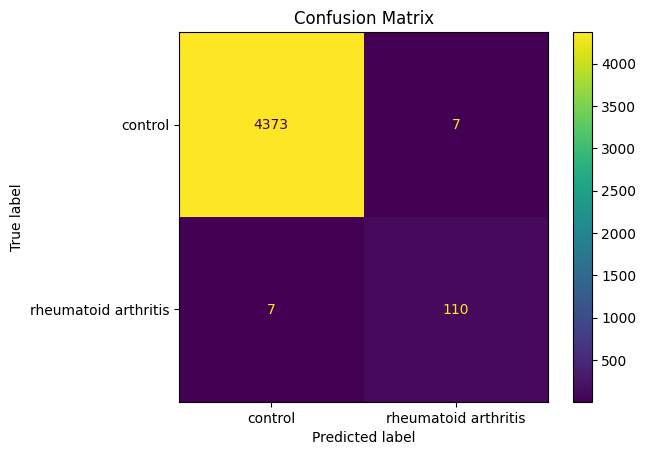

In [19]:
Display_ConfusionMatrix(lasso_model,X_train,y_train)    #训练集

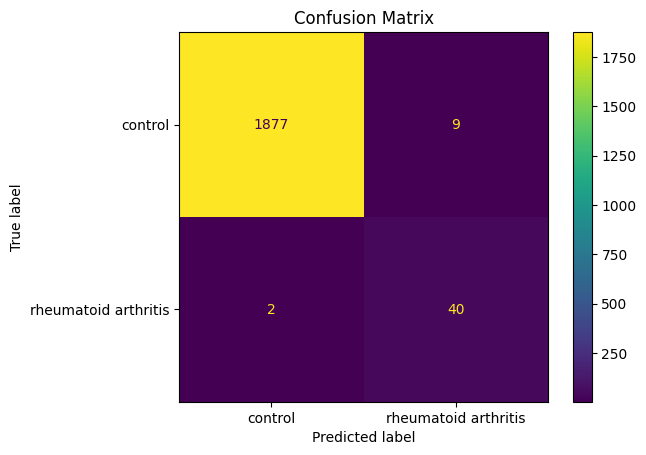

In [20]:
Display_ConfusionMatrix(lasso_model,X_test,y_test)   #测试集

In [21]:
#提取特征并进行特征选择
import numpy as np
LassoFeature_Index=np.where(lasso_model.coef_!=0)[1]
LassoFeature=FselectorData.iloc[:,LassoFeature_Index]
LassoFeature.shape

(6425, 59)

In [22]:
#输出lossa模型
import joblib
joblib.dump(lasso_model,'/mnt/workspace/Analysis Model/LossaModel.pkl')

['/mnt/workspace/Analysis Model/LossaModel.pkl']

使用Lasso验证DNA甲基化位点特征选择后的结果.

In [23]:
#使用特征选择后的模型验证模型精度-输入[batchs,70],输出[batch,1]
X_TrainEv,X_testEv,y_trainEv,y_testEv=train_test_split(LassoFeature,Target, test_size=0.3, random_state=2024)
lasso_modelEvaluateD=LogisticRegression(penalty='l1',solver='liblinear',C=0.1,random_state=2024,max_iter=10000)
lasso_modelEvaluateD.fit(X_TrainEv,y_trainEv)

LogisticRegression(C=0.1, max_iter=10000, penalty='l1', random_state=2024,
                   solver='liblinear')

In [24]:
#使用特征选择后的数据集再次训练模型评估特征选择效果-10折交叉验证
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold,cross_val_score
from sklearn.model_selection import cross_validate
def Model_Evelate_CV(Model,Data,Target):
    cv=KFold(n_splits=10, shuffle=True, random_state=2025)
    kv_scores =cross_validate(Model,Data,Target,cv=cv,scoring='accuracy',
                          return_train_score=True)
    print('Fit_time:',kv_scores['fit_time'])
    print('Mean Fit_time:',kv_scores['fit_time'].mean())
    print('score_time:',kv_scores['score_time'])
    print('Mean score_time:',kv_scores['score_time'].mean())
    print('train_score:',kv_scores['train_score'])
    print('Mean train_score:',kv_scores['train_score'].mean())
    print('test_score:',kv_scores['test_score'])
    print('Mean test_score:',kv_scores['test_score'].mean())
#用特征选择后的数据集再次训练模型评估特征选择效果-10折交叉验证
lasso_modelEvaluate=LogisticRegression(penalty='l1',solver='liblinear',C=0.1,random_state=2024,max_iter=10000)    # 设置Lasso模型
Model_Evelate_CV(Model=lasso_modelEvaluate,Data=LassoFeature,Target=Target)

Fit_time: [0.13763237 0.15320015 0.17018366 0.14581394 0.12758136 0.13371754
 0.1441164  0.13194776 0.13309407 0.13670778]
Mean Fit_time: 0.14139950275421143
score_time: [0.00301838 0.00292587 0.00316906 0.00275707 0.003124   0.00312471
 0.00284743 0.00251055 0.0025866  0.00309825]
Mean score_time: 0.0029161930084228515
train_score: [0.99688689 0.99740574 0.99723279 0.99723279 0.99723279 0.99740619
 0.99740619 0.99706035 0.99671451 0.99757911]
Mean train_score: 0.9972157356217635
test_score: [0.99377916 0.99377916 0.99533437 0.99688958 0.99688958 0.99221184
 0.99376947 0.99688474 0.99844237 0.9953271 ]
Mean test_score: 0.9953307364718537


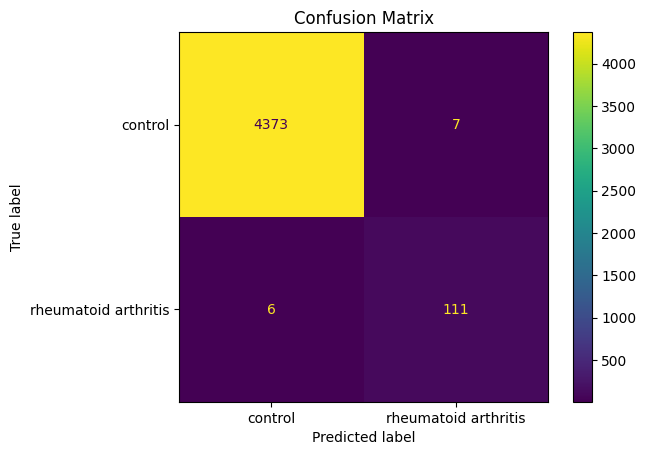

In [25]:
#训练集混淆举证
Display_ConfusionMatrix(lasso_modelEvaluateD,X_TrainEv,y_trainEv)

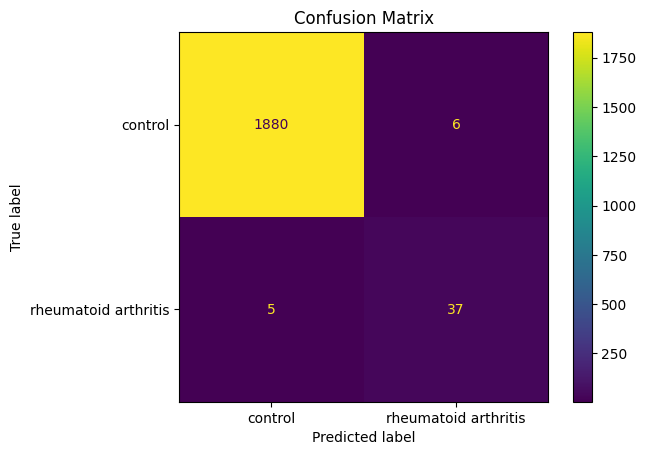

In [26]:
#测试集混淆举证
Display_ConfusionMatrix(lasso_modelEvaluateD,X_testEv,y_testEv)

In [27]:
#整合并输出特征选择结果
CG_Feature=Data.iloc[:,LassoFeature_Index]
DNA_Methylstion_Feature=pd.concat([CG_Feature,Data.iloc[:,-7:]],axis=1)
DNA_Methylstion_Feature.shape

(6425, 66)

In [28]:
#输出特征选择甲基化数据
DNA_Methylstion_Feature.to_pickle('/mnt/workspace/DNA methylation data/RA DNA methylation/RA_Methylation_Feature.pkl')
DNA_Methylstion_Feature.to_excel('/mnt/workspace/DNA methylation data/RA DNA methylation/RA_Methylation_Feature.xlsx','UTF-8')
DNA_Methylstion_Feature.to_csv('/mnt/workspace/DNA methylation data/RA DNA methylation/RA_Methylation_Feature.csv')

使用机器学习提取关键甲基化位点

In [1]:
#读取特征选择后的甲基化数据
import pandas as pd
MethylationFeature=pd.read_csv('/mnt/workspace/RA_Methylation_Feature.csv')
MethylationFeature.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6425 entries, 0 to 6424
Data columns (total 67 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           6425 non-null   int64  
 1   cg00455876           6425 non-null   float64
 2   cg05544622           6425 non-null   float64
 3   cg00423014           6425 non-null   float64
 4   cg00478198           6425 non-null   float64
 5   cg00776430           6425 non-null   float64
 6   cg01938887           6425 non-null   float64
 7   cg02714462           6425 non-null   float64
 8   cg02896361           6425 non-null   float64
 9   cg02971902           6425 non-null   float64
 10  cg03601619           6425 non-null   float64
 11  cg04029664           6425 non-null   float64
 12  cg04302300           6425 non-null   float64
 13  cg04699313           6425 non-null   float64
 14  cg05257372           6425 non-null   float64
 15  cg05443523           6425 non-null   f

In [2]:
MethylationFeature.isnull().sum().sum()    #检测空缺数据

0

Counter({'F': 3430, 'M': 2995})


<Axes: >

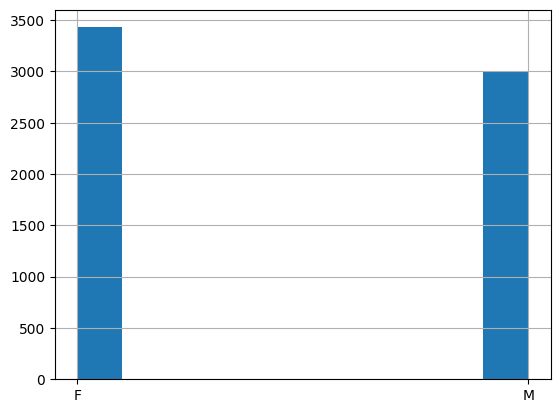

In [3]:
#统计性别数据
from collections import Counter
print(Counter(MethylationFeature['gender']))
MethylationFeature['gender'].hist()

Counter({'control': 6266, 'rheumatoid arthritis': 159})


<Axes: >

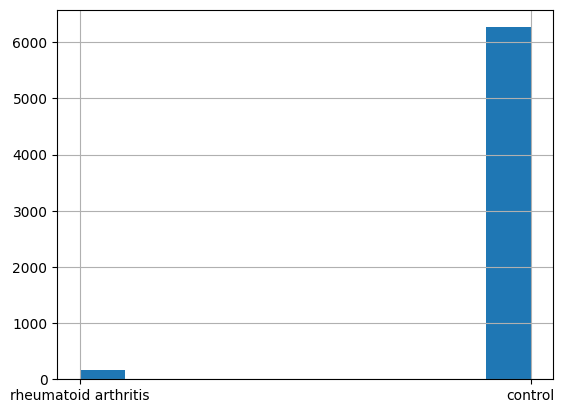

In [4]:
#统计疾病数据
print(Counter(MethylationFeature['disease']))
MethylationFeature['disease'].hist()

进行机器学习分析，筛选类风湿性关节炎特征甲基化位点。

In [5]:
Methylation=MethylationFeature.iloc[:,1:-7]    #甲基化数据
MapData=MethylationFeature.loc[:,['age','GenderEncoder','DiseaseEncoder']]    #其他附加数据
MLData=pd.concat([Methylation,MapData],axis=1)    #数据合并
MLData.shape

(6425, 62)

正常样本与疾病样本总量差异较大，使用数据重采样算法解决数据类别分布不均衡问题。

In [6]:
#查看模型混淆矩阵
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
def Display_ConfusionMatrix(model,data,target):
    ConfusionMatrix_result=confusion_matrix(target,model.predict(data),labels=[0,1])    #计算混淆举证
    Display_ConfusionMatrix=ConfusionMatrixDisplay(ConfusionMatrix_result,display_labels=['control','rheumatoid arthritis'])
    Display_ConfusionMatrix.plot(include_values=True, cmap='viridis', xticks_rotation='horizontal', values_format='d', ax=None)
    plt.title('Confusion Matrix')
    plt.show()

In [7]:
#计算测试集PR曲线
from pandas import DataFrame
from sklearn.metrics import precision_recall_curve,accuracy_score
def PR_Curve(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2024)    #划分数据集
    predict_score=Model.predict_proba(X_test)[:, 1]    #获取概率值
    predict=Model.predict(X_test)     #获取预测标签
    accuracy=accuracy_score(y_test,predict)
    precision, recall, thresholds = precision_recall_curve(y_test, predict_score)    #计算PR曲线
    PR=DataFrame()    #将PR曲线数据合并到DataFrame
    #PR['thresholds']=thresholds
    PR['recall']=recall
    PR['precision']=precision
    return PR,accuracy

In [8]:
#计算测试集ROC曲线
from sklearn.metrics import roc_curve, auc
def ROC_Curve(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2024)    #划分数据集
    predict_score=Model.predict_proba(X_test)[:, 1]    #获取概率值
    fpr, tpr, thresholds = roc_curve(y_test, predict_score)
    roc_auc = auc(fpr, tpr)    #计算AUC
    ROC=DataFrame()    #将PR曲线数据合并到DataFrame
    #ROC['thresholds']=thresholds
    ROC['tpr']=tpr
    ROC['fpr']=fpr
    return ROC,roc_auc

In [9]:
#编写模型训练评估函数
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score
def RunTestModel(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2024)    #划分数据集
    Model.fit(X_train,y_train)    #训练模型
    TrainPredict=Model.predict(X_train)    #计算训练集指标
    TrainPrecision=precision_score(y_train,TrainPredict)
    TrainRecall=recall_score(y_train,TrainPredict)
    TrainF1=f1_score(y_train,TrainPredict)
    TrainAcuracy=accuracy_score(y_train,TrainPredict)
    print('模型训练集Precision:{0},Recall:{1},F1_Score:{2},Accuracy:{3}'.format(TrainPrecision,TrainRecall,TrainF1,TrainAcuracy))
    TestPredict=Model.predict(X_test)    #测试集预测结果
    TestPrecision=precision_score(y_test,TestPredict)
    TestRecall=recall_score(y_test,TestPredict)
    TestF1=f1_score(y_test,TestPredict)
    TestAccuracy=accuracy_score(y_test,TestPredict)
    print('模型测试集Precision:{0},Recall:{1},F1_score:{2},Accuracy:{3}'.format(TestPrecision,TestRecall,TestF1,TestAccuracy))
    print('-------------------测试集混淆举证-------------------')
    Display_ConfusionMatrix(model=Model,data=X_test,target=y_test)

In [10]:
#切割数据
MLTestData=MLData.iloc[:,:-1]
MLTestLabel=MLData.iloc[:,-1]

In [11]:
#数据归一化
from pandas import DataFrame
from sklearn.preprocessing import StandardScaler,MinMaxScaler
ColumnsNames=MLTestData.columns
Stand=StandardScaler()
StandData=Stand.fit_transform(MLTestData)
MinMax=MinMaxScaler(feature_range=(0,1))
MinMaxData=MinMax.fit_transform(StandData)
MLTestData=DataFrame(MinMaxData)
MLTestData.columns=ColumnsNames

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:0.75,Recall:0.07142857142857142,F1_score:0.13043478260869565,Accuracy:0.979253112033195
-------------------测试集混淆举证-------------------


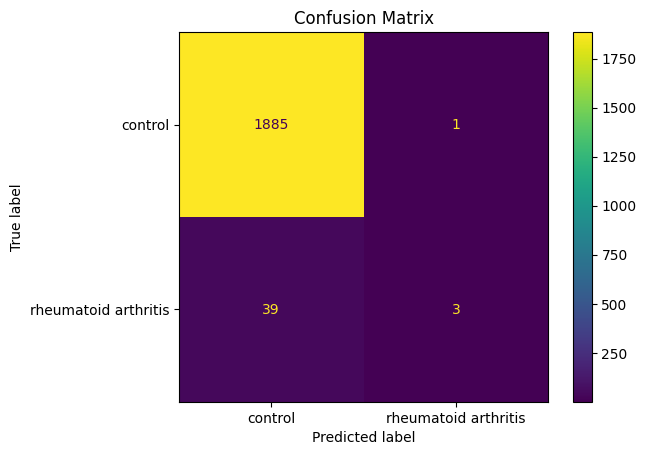

In [12]:
#使用随机森林算法作为衡量基准测试数据重采样算法性能
from sklearn.ensemble import RandomForestClassifier
Forest=RandomForestClassifier(random_state=2025)
RunTestModel(Model=Forest,Data=MLTestData,Label=MLTestLabel)

In [14]:
RF_PR,RF_Accuracy=PR_Curve(Model=Forest,Data=MLTestData,Label=MLTestLabel)

In [15]:
RF_ROC,RF_AUC=ROC_Curve(Model=Forest,Data=MLTestData,Label=MLTestLabel)

In [19]:
#输出相关数据
RF_PR.to_excel('/mnt/workspace/Analysis Data/Resample PR Data/RF_PR.xlsx')
RF_ROC.to_excel('/mnt/workspace/Analysis Data/Resample ROC Data/RF_ROC.xlsx')

测试欠采样算法。

In [22]:
#使用CNN算法进行欠采样
from imblearn.under_sampling import CondensedNearestNeighbour
CNN=CondensedNearestNeighbour(sampling_strategy='not minority',random_state=2024,n_jobs=-1)
CNN_TestData,CNN_TestLabel=CNN.fit_resample(MLTestData,MLTestLabel)
Counter(CNN_TestLabel)

Counter({0: 338, 1: 159})

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:0.675,Recall:0.6136363636363636,F1_score:0.6428571428571429,Accuracy:0.8
-------------------测试集混淆举证-------------------


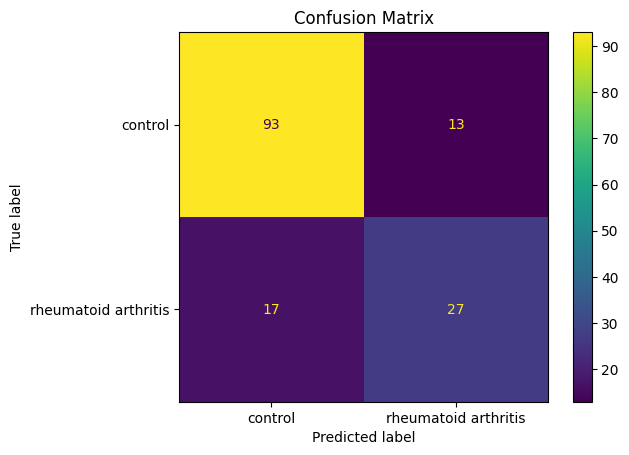

In [23]:
ForestCNN=RandomForestClassifier(random_state=2025)
RunTestModel(Model=ForestCNN,Data=CNN_TestData,Label=CNN_TestLabel)

In [24]:
CNN_RF_PR,CNN_RF_Accuracy=PR_Curve(Model=ForestCNN,Data=CNN_TestData,Label=CNN_TestLabel)
CNN_RF_ROC,CNN_RF_AUC=ROC_Curve(Model=ForestCNN,Data=CNN_TestData,Label=CNN_TestLabel)

In [25]:
#输出相关数据
CNN_RF_PR.to_excel('/mnt/workspace/Analysis Data/Resample PR Data/CNN_RF_PR.xlsx')
CNN_RF_ROC.to_excel('/mnt/workspace/Analysis Data/Resample ROC Data/CNN_RF_ROC.xlsx')

In [26]:
#使用IHT算法进行欠采样
from imblearn.under_sampling import InstanceHardnessThreshold
IHT=InstanceHardnessThreshold(random_state=2024,cv=5,n_jobs=-1)
IHT_TestData,IHT_TestLabel=IHT.fit_resample(MLTestData,MLTestLabel)
Counter(IHT_TestLabel)

Counter({0: 3767, 1: 159})

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:1.0,Recall:0.7719298245614035,F1_score:0.8712871287128713,Accuracy:0.9889643463497453
-------------------测试集混淆举证-------------------


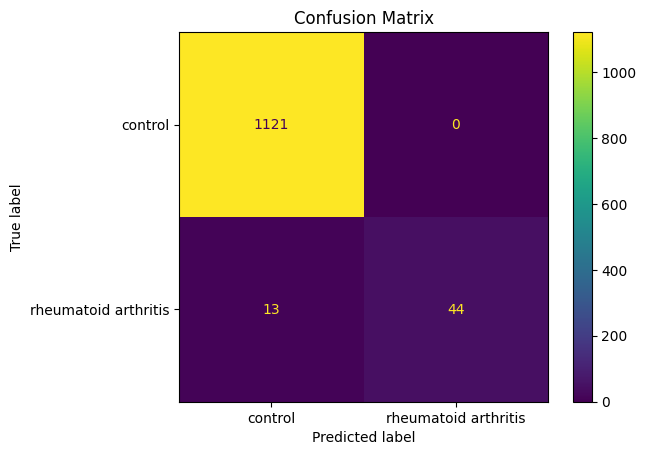

In [27]:
ForestIHT=RandomForestClassifier(random_state=2025)
RunTestModel(Model=ForestIHT,Data=IHT_TestData,Label=IHT_TestLabel)

In [28]:
IHT_RF_PR,IHT_RF_Accuracy=PR_Curve(Model=ForestIHT,Data=IHT_TestData,Label=IHT_TestLabel)
IHT_RF_ROC,IHT_RF_AUC=ROC_Curve(Model=ForestIHT,Data=IHT_TestData,Label=IHT_TestLabel)
#输出相关数据
IHT_RF_PR.to_excel('/mnt/workspace/Analysis Data/Resample PR Data/IHT_RF_PR.xlsx')
IHT_RF_ROC.to_excel('/mnt/workspace/Analysis Data/Resample ROC Data/IHT_RF_ROC.xlsx')

In [29]:
#使用NearMiss进行欠采样
from imblearn.under_sampling import NearMiss
NM=NearMiss(sampling_strategy='not minority',n_jobs=-1)
NM_TestData,NM_TestLabel=NM.fit_resample(MLTestData,MLTestLabel)
Counter(NM_TestLabel)

Counter({0: 159, 1: 159})

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:0.8653846153846154,Recall:0.8490566037735849,F1_score:0.8571428571428571,Accuracy:0.84375
-------------------测试集混淆举证-------------------


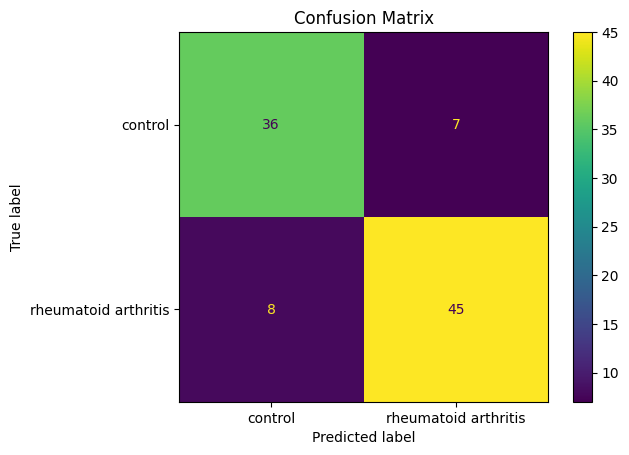

In [30]:
ForestNM=RandomForestClassifier(random_state=2025)
RunTestModel(Model=ForestNM,Data=NM_TestData,Label=NM_TestLabel)

In [31]:
NM_RF_PR,NM_RF_Accuracy=PR_Curve(Model=ForestNM,Data=NM_TestData,Label=NM_TestLabel)
NM_RF_ROC,NM_RF_AUC=ROC_Curve(Model=ForestNM,Data=NM_TestData,Label=NM_TestLabel)
#输出相关数据
NM_RF_PR.to_excel('/mnt/workspace/Analysis Data/Resample PR Data/NM_RF_PR.xlsx')
NM_RF_ROC.to_excel('/mnt/workspace/Analysis Data/Resample ROC Data/NM_RF_ROC.xlsx')

In [32]:
#使用NeighbourhoodCleaningRule进行欠采样
from imblearn.under_sampling import NeighbourhoodCleaningRule
NBC=NeighbourhoodCleaningRule(sampling_strategy='not minority',n_jobs=-1)
NBC_TestData,NBC_TestLabel=NBC.fit_resample(MLTestData,MLTestLabel)
Counter(NBC_TestLabel)

Counter({0: 6109, 1: 159})

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:1.0,Recall:0.24390243902439024,F1_score:0.39215686274509803,Accuracy:0.9835194045720361
-------------------测试集混淆举证-------------------


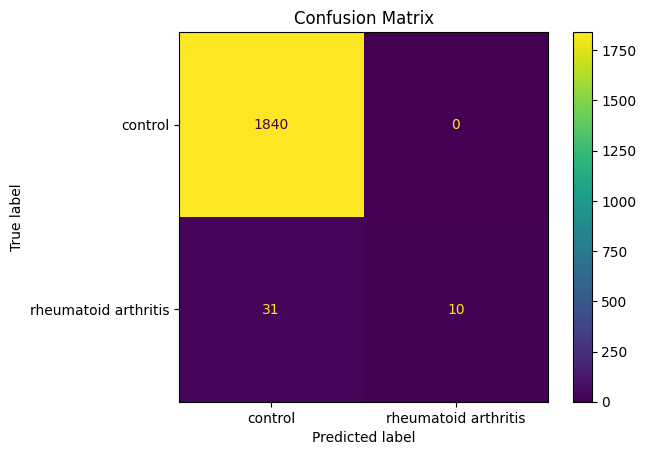

In [33]:
ForestNBC=RandomForestClassifier(random_state=2025)
RunTestModel(Model=ForestNBC,Data=NBC_TestData,Label=NBC_TestLabel)

In [34]:
NBC_RF_PR,NBC_RF_Accuracy=PR_Curve(Model=ForestNBC,Data=NBC_TestData,Label=NBC_TestLabel)
NBC_RF_ROC,NBC_RF_AUC=ROC_Curve(Model=ForestNBC,Data=NBC_TestData,Label=NBC_TestLabel)
#输出相关数据
NBC_RF_PR.to_excel('/mnt/workspace/Analysis Data/Resample PR Data/NBC_RF_PR.xlsx')
NBC_RF_ROC.to_excel('/mnt/workspace/Analysis Data/Resample ROC Data/NBC_RF_ROC.xlsx')

In [35]:
#使用OneSidedSelection进行欠采样
from imblearn.under_sampling import OneSidedSelection
OSS=OneSidedSelection(sampling_strategy='not minority',random_state=2024,n_jobs=-1)
OSS_TestData,OSS_TestLabel=OSS.fit_resample(MLTestData,MLTestLabel)
Counter(OSS_TestLabel)

Counter({0: 6163, 1: 159})

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:1.0,Recall:0.10869565217391304,F1_score:0.19607843137254902,Accuracy:0.9783869267264101
-------------------测试集混淆举证-------------------


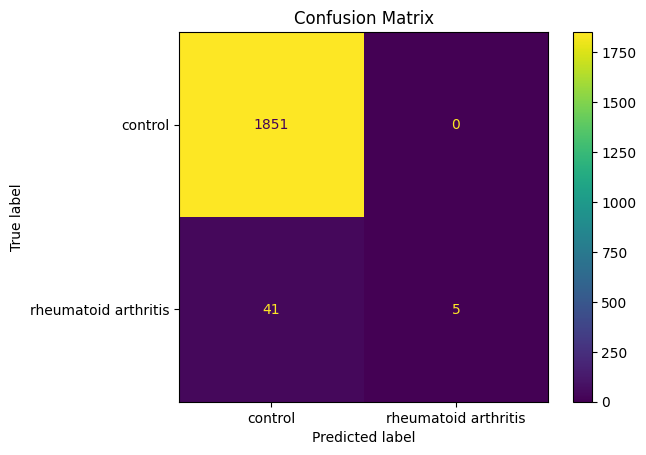

In [36]:
ForestOSS=RandomForestClassifier(random_state=2025)
RunTestModel(Model=ForestOSS,Data=OSS_TestData,Label=OSS_TestLabel)

In [37]:
OSS_RF_PR,OSS_RF_Accuracy=PR_Curve(Model=ForestOSS,Data=OSS_TestData,Label=OSS_TestLabel)
OSS_RF_ROC,OSS_RF_AUC=ROC_Curve(Model=ForestOSS,Data=OSS_TestData,Label=OSS_TestLabel)
#输出相关数据
OSS_RF_PR.to_excel('/mnt/workspace/Analysis Data/Resample PR Data/OSS_RF_PR.xlsx')
OSS_RF_ROC.to_excel('/mnt/workspace/Analysis Data/Resample ROC Data/OSS_RF_ROC.xlsx')

In [38]:
#使用随机欠采样进行数据欠采样
from imblearn.under_sampling import RandomUnderSampler
RUS=RandomUnderSampler(sampling_strategy='not minority',random_state=2024)
RUS_TestData,RUS_TestLabel=RUS.fit_resample(MLTestData,MLTestLabel)
Counter(RUS_TestLabel)

Counter({0: 159, 1: 159})

模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:0.9444444444444444,Recall:0.9622641509433962,F1_score:0.9532710280373832,Accuracy:0.9479166666666666
-------------------测试集混淆举证-------------------


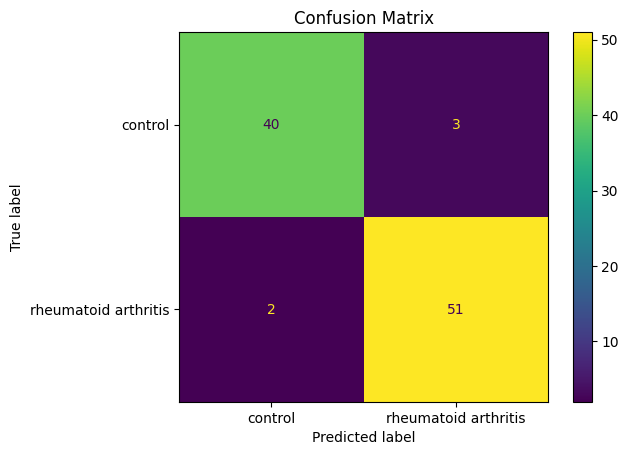

In [39]:
ForestRUS=RandomForestClassifier(random_state=2025)
RunTestModel(Model=ForestRUS,Data=RUS_TestData,Label=RUS_TestLabel)

In [40]:
RUS_RF_PR,RUS_RF_Accuracy=PR_Curve(Model=ForestRUS,Data=RUS_TestData,Label=RUS_TestLabel)
RUS_RF_ROC,RUS_RF_AUC=ROC_Curve(Model=ForestRUS,Data=RUS_TestData,Label=RUS_TestLabel)
#输出相关数据
RUS_RF_PR.to_excel('/mnt/workspace/Analysis Data/Resample PR Data/RUS_RF_PR.xlsx')
RUS_RF_ROC.to_excel('/mnt/workspace/Analysis Data/Resample ROC Data/RUS_RF_ROC.xlsx')

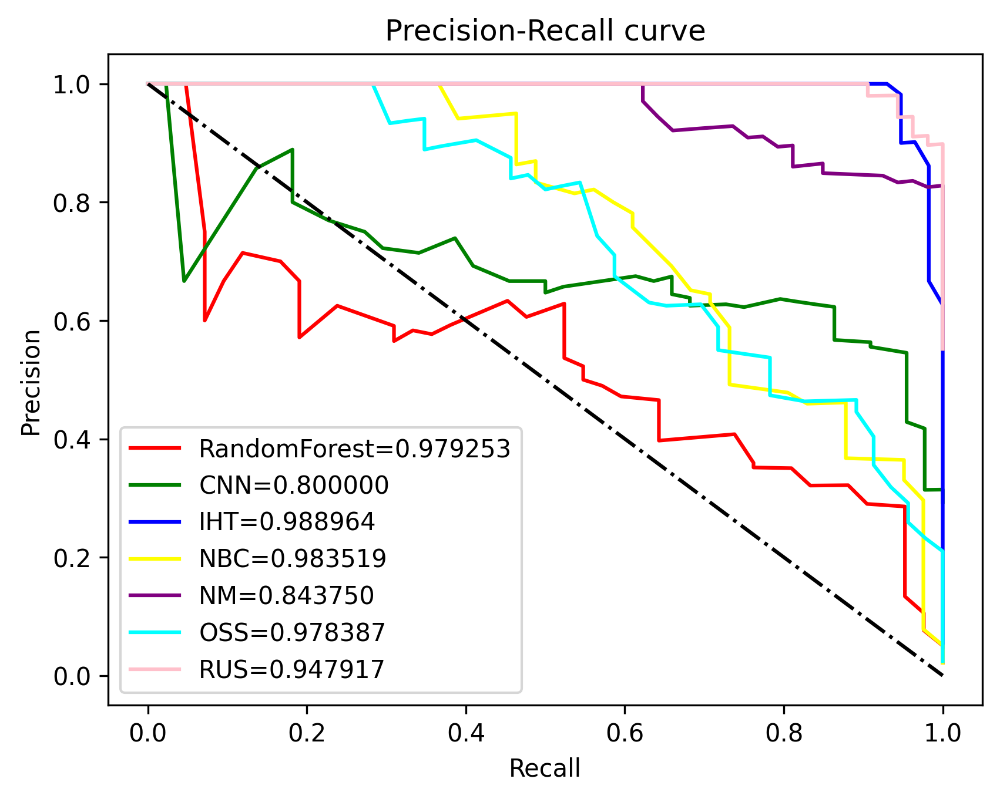

In [41]:
#绘制PR曲线
import matplotlib.pyplot as plt
PR_curve=plt.figure(dpi=300)
PR_ax=PR_curve.add_subplot(111)
PR_ax.set_title('Precision-Recall curve')
PR_ax.plot(RF_PR['recall'], RF_PR['precision'],color='red',label='RandomForest=%f'%RF_Accuracy)
PR_ax.plot(CNN_RF_PR['recall'], CNN_RF_PR['precision'],color='green',label='CNN=%f'%CNN_RF_Accuracy)
PR_ax.plot(IHT_RF_PR['recall'], IHT_RF_PR['precision'],color='blue',label='IHT=%f'%IHT_RF_Accuracy)
PR_ax.plot(NBC_RF_PR['recall'], NBC_RF_PR['precision'],color='yellow',label='NBC=%f'%NBC_RF_Accuracy)
PR_ax.plot(NM_RF_PR['recall'], NM_RF_PR['precision'],color='purple',label='NM=%f'%NM_RF_Accuracy)
PR_ax.plot(OSS_RF_PR['recall'], OSS_RF_PR['precision'],color='cyan',label='OSS=%f'%OSS_RF_Accuracy)
PR_ax.plot(RUS_RF_PR['recall'], RUS_RF_PR['precision'],color='pink',label='RUS=%f'%RUS_RF_Accuracy)
PR_ax.plot([0,1],[1,0],linestyle='-.',color='black')
PR_ax.set_xlabel('Recall')  
PR_ax.set_ylabel('Precision')    
plt.legend(loc="best")  
plt.show()

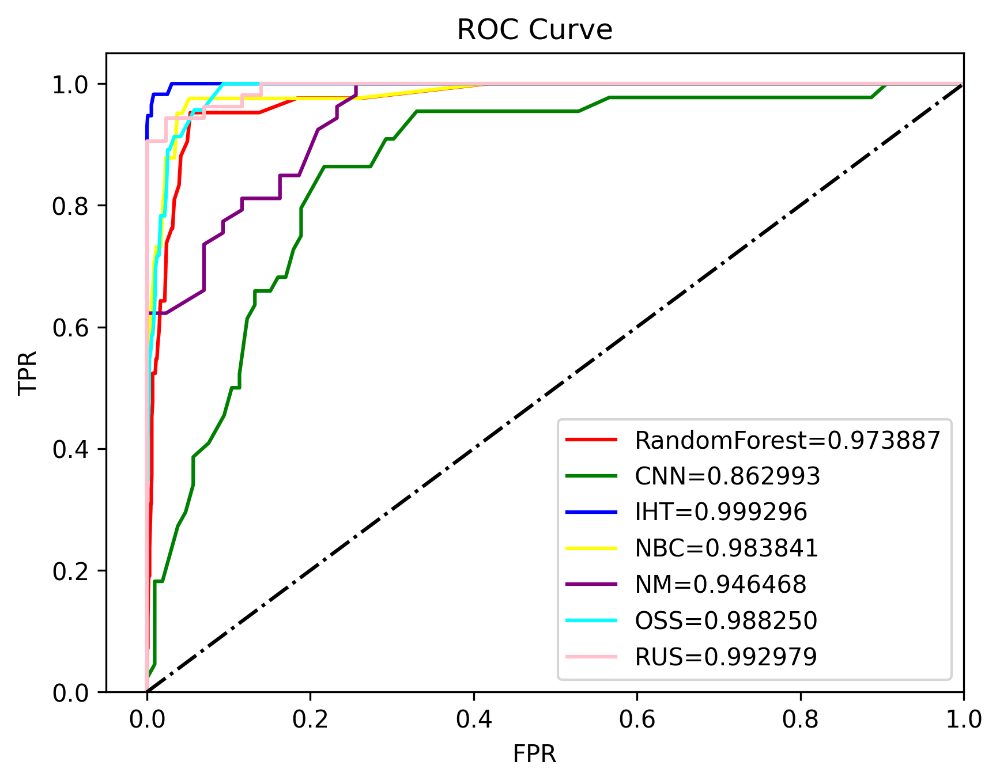

In [42]:
#绘制ROC曲线
import matplotlib.pyplot as plt
ROC_curve=plt.figure(dpi=300)
ROC_ax=ROC_curve.add_subplot(111)
ROC_ax.set_title('ROC Curve')
ROC_ax.plot(RF_ROC['fpr'], RF_ROC['tpr'],color='red',label='RandomForest=%f'%RF_AUC)
ROC_ax.plot(CNN_RF_ROC['fpr'], CNN_RF_ROC['tpr'],color='green',label='CNN=%f'%CNN_RF_AUC)
ROC_ax.plot(IHT_RF_ROC['fpr'], IHT_RF_ROC['tpr'],color='blue',label='IHT=%f'%IHT_RF_AUC)
ROC_ax.plot(NBC_RF_ROC['fpr'], NBC_RF_ROC['tpr'],color='yellow',label='NBC=%f'%NBC_RF_AUC)
ROC_ax.plot(NM_RF_ROC['fpr'], NM_RF_ROC['tpr'],color='purple',label='NM=%f'%NM_RF_AUC)
ROC_ax.plot(OSS_RF_ROC['fpr'], OSS_RF_ROC['tpr'],color='cyan',label='OSS=%f'%OSS_RF_AUC)
ROC_ax.plot(RUS_RF_ROC['fpr'], RUS_RF_ROC['tpr'],color='pink',label='RUS=%f'%RUS_RF_AUC)
ROC_ax.plot([0,1],[0,1],linestyle='-.',color='black')
ROC_ax.set_xlim([-0.05, 1.0])  
ROC_ax.set_ylim([0, 1.05])  
ROC_ax.set_xlabel('FPR')  
ROC_ax.set_ylabel('TPR')    
plt.legend(loc="best")  
plt.show()

In [122]:
import joblib
Model=[Forest,ForestCNN,ForestIHT,ForestNM,ForestNBC,ForestOSS,ForestRUS]
ModelStr=['Forest.pkl','ForestCNN.pkl','ForestIHT.pkl','ForestNM.pkl','ForestNBC.pkl','ForestOSS.pkl','ForestRUS.pkl']
try:
    for model,modelstr in zip(Model,ModelStr):
        joblib.dump(model,'/mnt/workspace/Analysis Model/Resample Models/'+modelstr)
    print('模型保存成功！')
except:
    print('模型保存异常！！！')

模型保存成功！


经过混淆矩阵、PR曲线、Roc曲线综合评估，选择随机过采样算法进行数据重采样。数据重采样后进行机器学习和深度神经网络训练并采用可解释性机器学习框架提取关键甲基化位点进行特征分析。

In [123]:
MethylationRUS=MethylationFeature.iloc[:,1:-1]
LabelRUS=MethylationFeature.iloc[:,-1]

In [124]:
#合并过采样结果
RUS=RandomUnderSampler(sampling_strategy='not minority',random_state=2024)
RUS_Methylation,RUS_Label=RUS.fit_resample(MethylationRUS,LabelRUS)
Counter(RUS_Label)

Counter({0: 159, 1: 159})

In [125]:
RUSData=pd.concat([RUS_Methylation,RUS_Label],axis=1)
RUSData.shape

(318, 66)

In [ ]:
#输出计算合并结果
RUSData.to_csv('/mnt/workspace/DNA methylation data/RA DNA methylation/RUS DNA Methylation Data.csv')
RUSData.to_excel('/mnt/workspace/DNA methylation data/RA DNA methylation/RUS DNA Methylation Data.xlsx','UFT-8')

读取数据进行机器学习提取特征位点。

In [1]:
#读取数据
import pandas as pd
MethylationData=pd.read_csv('/mnt/workspace/DNA methylation data/RA DNA methylation/RUS DNA Methylation Data.csv')
MethylationData.shape

(318, 67)

In [2]:
#检查空缺数据
MethylationData.isnull().sum().sum()

0

In [3]:
#数据选择和缩放数据
MLFeatureData=MethylationData.iloc[:,1:-6]
MLFeatureData=pd.concat([MLFeatureData,MethylationData.loc[:,'GenderEncoder']],axis=1)
MLFeatureData

,cg00455876,cg05544622,cg00423014,cg00478198,cg00776430,cg01938887,cg02714462,cg02896361,cg02971902,cg03601619,...,cg00455424,cg00534295,cg00543485,cg00581848,cg01393939,cg01439876,cg01446477,cg01515508,age,GenderEncoder
0,0.000000,0.000000,1.202370,0.224898,-1.672671,-1.271175,3.201956,-0.480968,-0.739857,3.406479,...,-4.940737,-3.343970,-4.178048,-2.616463,3.149987,-2.207487,-3.100385,3.701353,19.0000,1.0
1,0.000000,0.000000,1.019899,0.409549,-1.578093,-1.130596,3.744756,-0.289957,-0.180452,2.555085,...,-3.790034,-6.163916,-6.811545,-2.468664,0.152263,-2.207487,-3.406479,3.543689,12.0000,1.0
2,0.000000,0.000000,0.241113,0.140201,-0.663152,-1.168907,3.507691,-0.076021,-0.570906,3.029956,...,-2.196336,-3.938986,-4.247583,0.000000,0.405382,-2.414368,-4.051632,1.557086,71.8192,1.0
3,0.510719,4.178048,1.839820,-1.848299,-2.698069,-2.921730,4.807960,-3.701353,-3.938986,2.401172,...,-3.790034,-4.489850,-6.163916,-2.732410,3.124904,-2.337277,-3.228904,4.178048,23.0000,0.0
4,0.000000,0.000000,0.837604,0.351505,-0.809306,-1.456115,4.402578,0.000000,-0.772045,2.681278,...,-3.580953,-3.256540,-5.773449,0.000000,2.241551,-2.414368,-3.659672,3.938986,84.0000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,0.000000,0.000000,0.000000,0.072017,0.000000,-1.798190,3.374769,0.000000,-0.654254,2.300497,...,-3.744756,-4.585271,-3.886935,0.000000,2.441207,-2.496772,-4.051632,4.402578,34.0000,1.0
314,0.000000,3.659672,0.000000,-2.600812,-3.149987,-4.112908,4.585271,0.000000,-4.489850,3.201956,...,-3.790034,-4.178048,-5.273603,0.000000,2.881228,-2.253116,-3.284902,3.993781,51.0000,0.0
315,0.000000,0.000000,1.130596,0.039997,0.000000,-2.163468,3.007447,0.000000,-0.767424,2.020410,...,-4.112908,-4.051632,-6.163916,0.000000,0.000000,-2.570129,-3.701353,3.472874,45.0000,1.0
316,0.000000,0.000000,0.000000,0.140201,0.000000,-1.578093,3.149987,0.000000,-0.506456,2.555085,...,-3.343970,-3.790034,-4.112908,0.000000,2.785946,-2.616463,-3.543689,4.178048,31.0000,1.0


In [4]:
#数据缩放和标准化
from pandas import DataFrame
from sklearn.preprocessing import StandardScaler,MinMaxScaler
FeatureNames=MLFeatureData.columns    #保存变量名
Standard=StandardScaler()    #标准化数据
StandardData=Standard.fit_transform(MLFeatureData)
MinMax=MinMaxScaler(feature_range=(0,1))    #缩放数据
MinMaxData=MinMax.fit_transform(StandardData)
MLRunData=DataFrame(MinMaxData)
MLRunData.columns=FeatureNames
MLRunData.shape

(318, 61)

In [5]:
#获取标签数据
ReMLLabel=MethylationData.iloc[:,-1]
ReMLLabel

0      0
1      0
2      0
3      0
4      0
      ..
313    1
314    1
315    1
316    1
317    1
Name: DiseaseEncoder, Length: 318, dtype: int64

In [6]:
#查看模型混淆矩阵
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay
def Display_ConfusionMatrix(model,data,target):
    ConfusionMatrix_result=confusion_matrix(target,model.predict(data),labels=[0,1])    #计算混淆举证
    Display_ConfusionMatrix=ConfusionMatrixDisplay(ConfusionMatrix_result,display_labels=['control','rheumatoid arthritis'])
    Display_ConfusionMatrix.plot(include_values=True, cmap='viridis', xticks_rotation='horizontal', values_format='d', ax=None)
    plt.title('Confusion Matrix')
    plt.show()

In [7]:
#计算PR曲线
from pandas import DataFrame
from sklearn.metrics import precision_recall_curve,accuracy_score
def PR_Curve(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2025)    #划分数据集
    predict_score=Model.predict_proba(X_test)[:, 1]    #获取概率值
    predict=Model.predict(X_test)     #获取预测标签
    accuracy=accuracy_score(y_test,predict)
    precision, recall, thresholds = precision_recall_curve(y_test, predict_score)    #计算PR曲线
    PR=DataFrame()    #将PR曲线数据合并到DataFrame
    #PR['thresholds']=thresholds
    PR['recall']=recall
    PR['precision']=precision
    return PR,accuracy

In [8]:
#计算ROC曲线
from sklearn.metrics import roc_curve, auc
def ROC_Curve(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2025)    #划分数据集
    predict_score=Model.predict_proba(X_test)[:, 1]    #获取概率值
    fpr, tpr, thresholds = roc_curve(y_test, predict_score)
    roc_auc = auc(fpr, tpr)    #计算AUC
    ROC=DataFrame()    #将PR曲线数据合并到DataFrame
    #ROC['thresholds']=thresholds
    ROC['tpr']=tpr
    ROC['fpr']=fpr
    return ROC,roc_auc

In [9]:
#模型训练评估函数
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score,recall_score,f1_score,accuracy_score
def RunMLModel(Model,Data,Label):
    X_train,X_test,y_train,y_test=train_test_split(Data,Label,train_size=0.7,random_state=2025)    #划分数据集
    Model.fit(X_train,y_train)    #训练模型
    TrainPredict=Model.predict(X_train)    #计算训练集指标
    TrainPrecision=precision_score(y_train,TrainPredict)
    TrainRecall=recall_score(y_train,TrainPredict)
    TrainF1=f1_score(y_train,TrainPredict)
    TrainAcuracy=accuracy_score(y_train,TrainPredict)
    print('模型训练集Precision:{0},Recall:{1},F1_Score:{2},Accuracy:{3}'.format(TrainPrecision,TrainRecall,TrainF1,TrainAcuracy))
    TestPredict=Model.predict(X_test)    #测试集预测结果
    TestPrecision=precision_score(y_test,TestPredict)
    TestRecall=recall_score(y_test,TestPredict)
    TestF1=f1_score(y_test,TestPredict)
    TestAccuracy=accuracy_score(y_test,TestPredict)
    print('模型测试集Precision:{0},Recall:{1},F1_score:{2},Accuracy:{3}'.format(TestPrecision,TestRecall,TestF1,TestAccuracy))
    print('-------------------测试集混淆举证-------------------')
    Display_ConfusionMatrix(model=Model,data=X_test,target=y_test)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1271: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 8.
  warnings.warn(


模型训练集Precision:0.8870967741935484,Recall:0.9649122807017544,F1_Score:0.9243697478991597,Accuracy:0.918918918918919
模型测试集Precision:0.88,Recall:0.9777777777777777,F1_score:0.9263157894736842,Accuracy:0.9270833333333334
-------------------测试集混淆举证-------------------


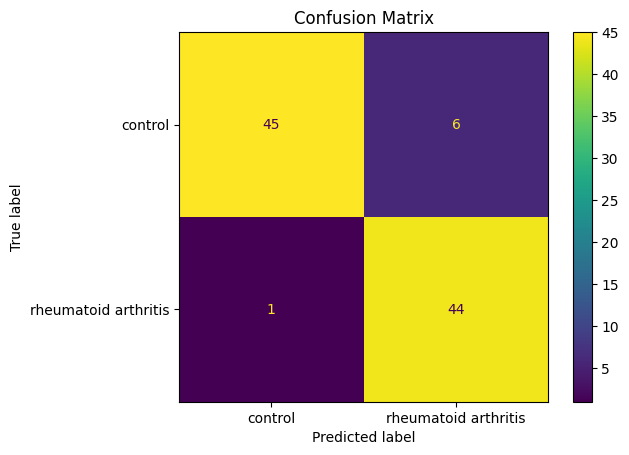

In [10]:
#测试Logistic回归
from sklearn.linear_model import LogisticRegression
Logistic=LogisticRegression(penalty="l2",dual=True,tol=1e-4,C=1.0,fit_intercept=True,random_state=2024,solver='liblinear',
                            max_iter=100,multi_class="auto",verbose=0, warm_start=False,n_jobs=-1,l1_ratio=None)
RunMLModel(Model=Logistic,Data=MLRunData,Label=ReMLLabel)

In [11]:
#计算PR曲线和ROC曲线值
Logistic_PR,Logistic_Accuracy=PR_Curve(Model=Logistic,Data=MLRunData,Label=ReMLLabel)    
Logistic_ROC,Logistic_AUC=ROC_Curve(Model=Logistic,Data=MLRunData,Label=ReMLLabel)
#输出PR曲线和ROC曲线结果
Logistic_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/Logistic_PR.xlsx','UTF-8')
Logistic_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/Logistic_ROC.xlsx','UTF-8')

/tmp/ipykernel_295/3354021341.py:5: FutureWarning: Starting with pandas version 3.0 all arguments of to_excel except for the argument 'excel_writer' will be keyword-only.
  Logistic_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/Logistic_PR.xlsx','UTF-8')
/tmp/ipykernel_295/3354021341.py:6: FutureWarning: Starting with pandas version 3.0 all arguments of to_excel except for the argument 'excel_writer' will be keyword-only.
  Logistic_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/Logistic_ROC.xlsx','UTF-8')


模型训练集Precision:0.8934426229508197,Recall:0.956140350877193,F1_Score:0.923728813559322,Accuracy:0.918918918918919
模型测试集Precision:0.9361702127659575,Recall:0.9777777777777777,F1_score:0.9565217391304348,Accuracy:0.9583333333333334
-------------------测试集混淆举证-------------------


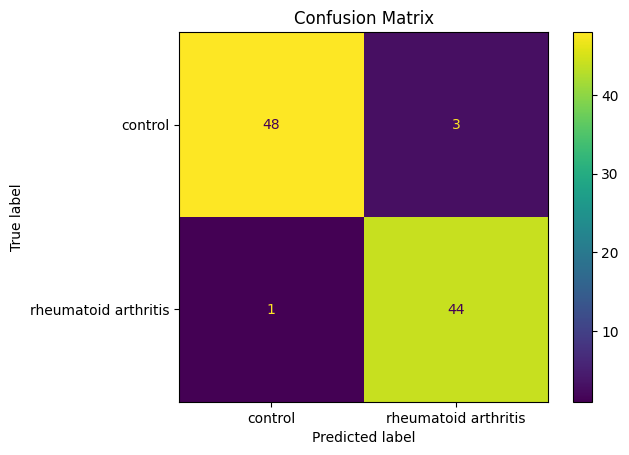

In [12]:
#测试SVM算法
from sklearn.svm import SVC
SVM_Classifier=SVC(C=1.0,kernel="rbf",degree=3,gamma="scale",coef0=0.0,shrinking=True,probability=True,tol=1e-3, 
                   cache_size=200,max_iter=-1, decision_function_shape="ovr",random_state=2024)
RunMLModel(Model=SVM_Classifier,Data=MLRunData,Label=ReMLLabel)

In [13]:
#计算PR曲线和ROC曲线值
SVM_PR,SVM_Accuracy=PR_Curve(Model=SVM_Classifier,Data=MLRunData,Label=ReMLLabel)    
SVM_ROC,SVM_AUC=ROC_Curve(Model=SVM_Classifier,Data=MLRunData,Label=ReMLLabel)
#输出PR曲线和ROC曲线结果
SVM_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/SVM_PR.xlsx','UTF-8')
SVM_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/SVM_ROC.xlsx','UTF-8')

/tmp/ipykernel_295/4264335228.py:5: FutureWarning: Starting with pandas version 3.0 all arguments of to_excel except for the argument 'excel_writer' will be keyword-only.
  SVM_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/SVM_PR.xlsx','UTF-8')
/tmp/ipykernel_295/4264335228.py:6: FutureWarning: Starting with pandas version 3.0 all arguments of to_excel except for the argument 'excel_writer' will be keyword-only.
  SVM_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/SVM_ROC.xlsx','UTF-8')


In [ ]:
#测试决策树算法
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
DecisionTree=DecisionTreeClassifier(criterion='gini',splitter='best',max_depth=10,min_samples_split=2,random_state=2024)
Research_params={'max_depth':np.arange(1,20,1,dtype=int),'min_samples_split':np.arange(1,20,1,dtype=int),
                 'criterion':['gini','entropy']}    #超参数列表
GridSearch=GridSearchCV(estimator=DecisionTree,param_grid=Research_params,cv=5,
                        scoring='accuracy',return_train_score=True,n_jobs=-1,verbose=0)
GridSearch.fit(MLRunData,ReMLLabel)
print('超参数搜索最佳超参数为；',GridSearch.best_params_)
print('超参数搜索最佳得分为:',GridSearch.best_score_)
Best_DTC=GridSearch.best_estimator_

超参数搜索最佳超参数为； {'criterion': 'gini', 'max_depth': 7, 'min_samples_split': 14}

超参数搜索最佳得分为: 0.88015873015873

模型训练集Precision:1.0,Recall:0.9649122807017544,F1_Score:0.9821428571428571,Accuracy:0.9819819819819819
模型测试集Precision:0.8913043478260869,Recall:0.9111111111111111,F1_score:0.9010989010989011,Accuracy:0.90625
-------------------测试集混淆举证-------------------


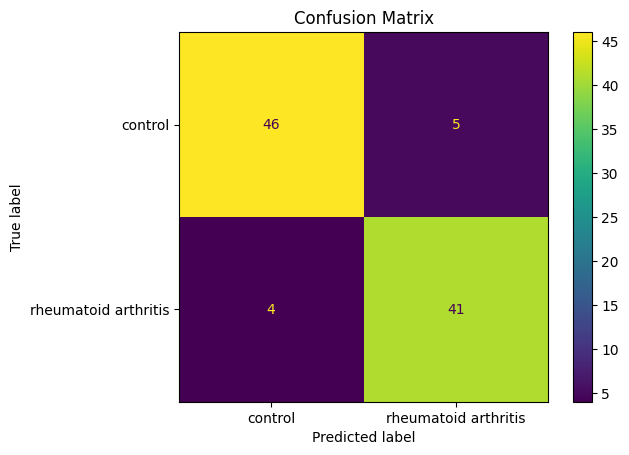

In [15]:
RunMLModel(Model=Best_DTC,Data=MLRunData,Label=ReMLLabel)

In [ ]:
#计算PR曲线和ROC曲线值
DTC_PR,DTC_Accuracy=PR_Curve(Model=Best_DTC,Data=MLRunData,Label=ReMLLabel)    
DTC_ROC,DTC_AUC=ROC_Curve(Model=Best_DTC,Data=MLRunData,Label=ReMLLabel)
#输出PR曲线和ROC曲线结果
DTC_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/DTC_PR.xlsx','UTF-8')
DTC_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/DTC_ROC.xlsx','UTF-8')

In [ ]:
#对随机森林进行网格搜索
from sklearn.ensemble import RandomForestClassifier
RandomForest=RandomForestClassifier(n_estimators=100,criterion='gini',max_depth=7,min_samples_split=6,
                                    bootstrap=True,min_samples_leaf=2,max_features='auto',random_state=2024)
RandomForest_params={'n_estimators':np.arange(1,40,2,dtype=int),'min_samples_leaf':np.arange(1,40,2,dtype=int),
                     'max_features':['auto','sqrt'],'criterion':['gini','entropy']}
GridSearch_RandomForest=GridSearchCV(estimator=RandomForest,param_grid=RandomForest_params,cv=5,
                        scoring='accuracy',return_train_score=False,n_jobs=-1,verbose=0)
GridSearch_RandomForest.fit(MLRunData,ReMLLabel)
print('超参数搜索最佳超参数为；',GridSearch_RandomForest.best_params_)
print('超参数搜索最佳得分为:',GridSearch_RandomForest.best_score_)
Best_Forest=GridSearch_RandomForest.best_estimator_

超参数搜索最佳超参数为； {'criterion': 'gini', 'max_features': 'sqrt', 'min_samples_leaf': 3, 'n_estimators': 29}

超参数搜索最佳得分为: 0.9526289682539681

模型训练集Precision:0.9912280701754386,Recall:0.9912280701754386,F1_Score:0.9912280701754386,Accuracy:0.990990990990991
模型测试集Precision:0.8913043478260869,Recall:0.9111111111111111,F1_score:0.9010989010989011,Accuracy:0.90625
-------------------测试集混淆举证-------------------


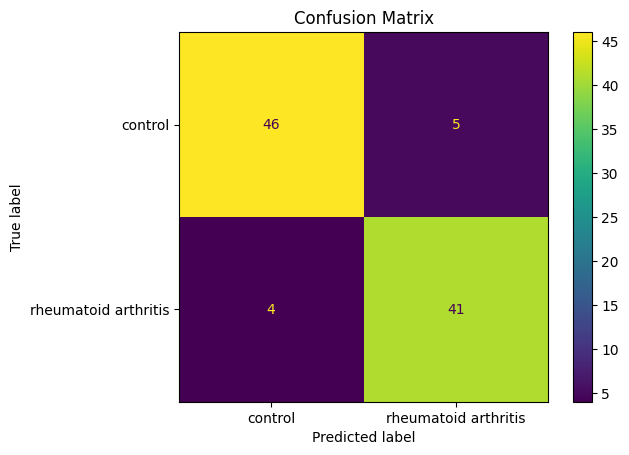

In [18]:
#评估最佳模型
RunMLModel(Model=Best_Forest,Data=MLRunData,Label=ReMLLabel)

In [ ]:
#计算PR曲线和ROC曲线值
RondomForest_PR,RondomForest_Accuracy=PR_Curve(Model=Best_Forest,Data=MLRunData,Label=ReMLLabel)    
RondomForest_ROC,RondomForest_AUC=ROC_Curve(Model=Best_Forest,Data=MLRunData,Label=ReMLLabel)
#输出PR曲线和ROC曲线结果
RondomForest_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/RondomForest_PR.xlsx','UTF-8')
RondomForest_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/RondomForest_ROC.xlsx','UTF-8')

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:06:40] WARNING: /workspace/src/common/error_msg.cc:45: `gpu_id` is deprecated since2.0.0, use `device` instead. E.g. device=cpu/cuda/cuda:0
  warnings.warn(smsg, UserWarning)


模型训练集Precision:1.0,Recall:1.0,F1_Score:1.0,Accuracy:1.0
模型测试集Precision:0.875,Recall:0.9333333333333333,F1_score:0.9032258064516129,Accuracy:0.90625
-------------------测试集混淆举证-------------------


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [10:06:41] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  warnings.warn(smsg, UserWarning)


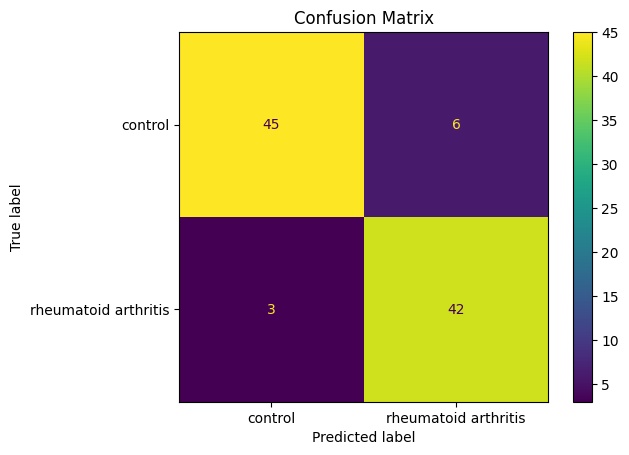

In [20]:
#测试XGBoost模型
from xgboost import XGBClassifier
XGBoost=XGBClassifier(n_jobs=-1,verbosity=1,tree_method='auto',gpu_id=0,random_state=2025)
RunMLModel(Model=XGBoost,Data=MLRunData,Label=ReMLLabel)

In [ ]:
#计算PR曲线和ROC曲线值
XGBoost_PR,XGBoost_Accuracy=PR_Curve(Model=XGBoost,Data=MLRunData,Label=ReMLLabel)    
XGBoost_ROC,XGBoost_AUC=ROC_Curve(Model=XGBoost,Data=MLRunData,Label=ReMLLabel)
#输出PR曲线和ROC曲线结果
XGBoost_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/XGBoost_PR.xlsx','UTF-8')
XGBoost_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/XGBoost_ROC.xlsx','UTF-8')

[LightGBM] [Warning] Unknown parameter: keep_training_booster
[LightGBM] [Warning] Unknown parameter: keep_training_booster
[LightGBM] [Info] Number of positive: 114, number of negative: 108
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001426 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2829
[LightGBM] [Info] Number of data points in the train set: 222, number of used features: 60
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.513514 -> initscore=0.054067
[LightGBM] [Info] Start training from score 0.054067
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No fu

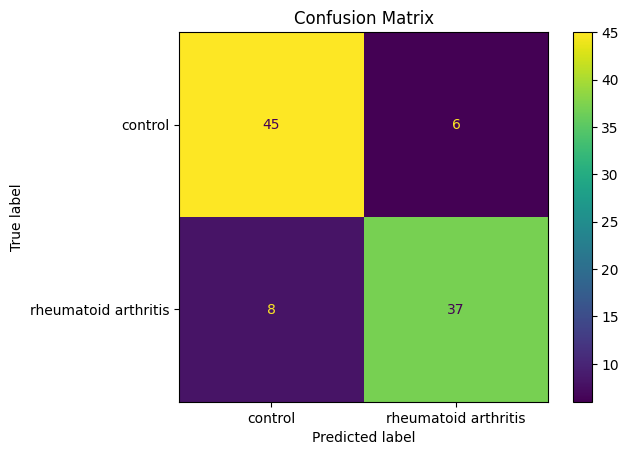

In [22]:
#测试LightGBM算法
from lightgbm import LGBMClassifier
LightGBM=LGBMClassifier(boosting_type='gbdt',num_leaves=31,learning_rate=0.01,n_estimators=200,
                        n_jobs=-1,objective='binary',metric='binary_logloss',keep_training_booster=True,
                       importance_type='gini',random_state=2025)
RunMLModel(Model=LightGBM,Data=MLRunData,Label=ReMLLabel)

In [ ]:
#计算PR曲线和ROC曲线值
LightGBM_PR,LightGBM_Accuracy=PR_Curve(Model=LightGBM,Data=MLRunData,Label=ReMLLabel)    
LightGBM_ROC,LightGBM_AUC=ROC_Curve(Model=LightGBM,Data=MLRunData,Label=ReMLLabel)
#输出PR曲线和ROC曲线结果
LightGBM_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/LightGBM_PR.xlsx','UTF-8')
LightGBM_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/LightGBM_ROC.xlsx','UTF-8')

0:	learn: 0.6846040	total: 52ms	remaining: 25.9s
1:	learn: 0.6759460	total: 54.4ms	remaining: 13.6s
2:	learn: 0.6681809	total: 56.6ms	remaining: 9.38s
3:	learn: 0.6605169	total: 58.6ms	remaining: 7.27s
4:	learn: 0.6532148	total: 60.6ms	remaining: 6s
5:	learn: 0.6457743	total: 62.7ms	remaining: 5.16s
6:	learn: 0.6374344	total: 64.8ms	remaining: 4.56s
7:	learn: 0.6280218	total: 66.9ms	remaining: 4.11s
8:	learn: 0.6199500	total: 69.1ms	remaining: 3.77s
9:	learn: 0.6115360	total: 71.2ms	remaining: 3.49s
10:	learn: 0.6058233	total: 73.3ms	remaining: 3.26s
11:	learn: 0.5972397	total: 75.4ms	remaining: 3.06s
12:	learn: 0.5893468	total: 77.4ms	remaining: 2.9s
13:	learn: 0.5827513	total: 79.3ms	remaining: 2.75s
14:	learn: 0.5732835	total: 81.3ms	remaining: 2.63s
15:	learn: 0.5660295	total: 83.3ms	remaining: 2.52s
16:	learn: 0.5597356	total: 85.3ms	remaining: 2.42s
17:	learn: 0.5534898	total: 87.3ms	remaining: 2.34s
18:	learn: 0.5459730	total: 89.3ms	remaining: 2.26s
19:	learn: 0.5379904	total: 

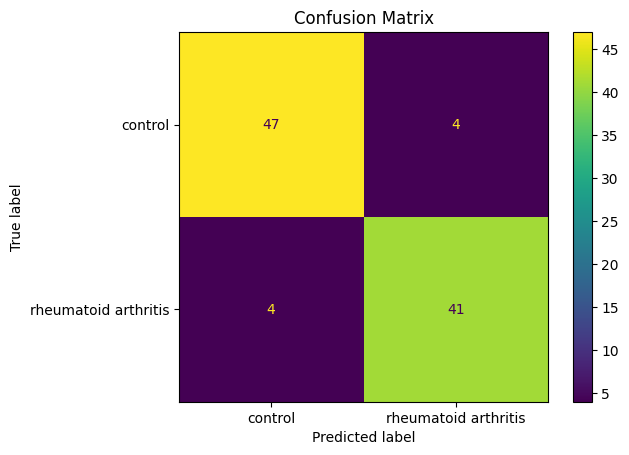

In [24]:
#测试CatBoost算法
from catboost import CatBoostClassifier
CatBoost=CatBoostClassifier(learning_rate=0.01,depth=6,iterations=500,thread_count=-1)
RunMLModel(Model=CatBoost,Data=MLRunData,Label=ReMLLabel)

In [ ]:
#计算PR曲线和ROC曲线值
CatBoost_PR,CatBoost_Accuracy=PR_Curve(Model=CatBoost,Data=MLRunData,Label=ReMLLabel)    
CatBoost_ROC,CatBoost_AUC=ROC_Curve(Model=CatBoost,Data=MLRunData,Label=ReMLLabel)
#输出PR曲线和ROC曲线结果
CatBoost_PR.to_excel('/mnt/workspace/Analysis Data/ML PR Data/CatBoost_PR.xlsx','UTF-8')
CatBoost_ROC.to_excel('/mnt/workspace/Analysis Data/ML ROC Data/CatBoost_ROC.xlsx','UTF-8')

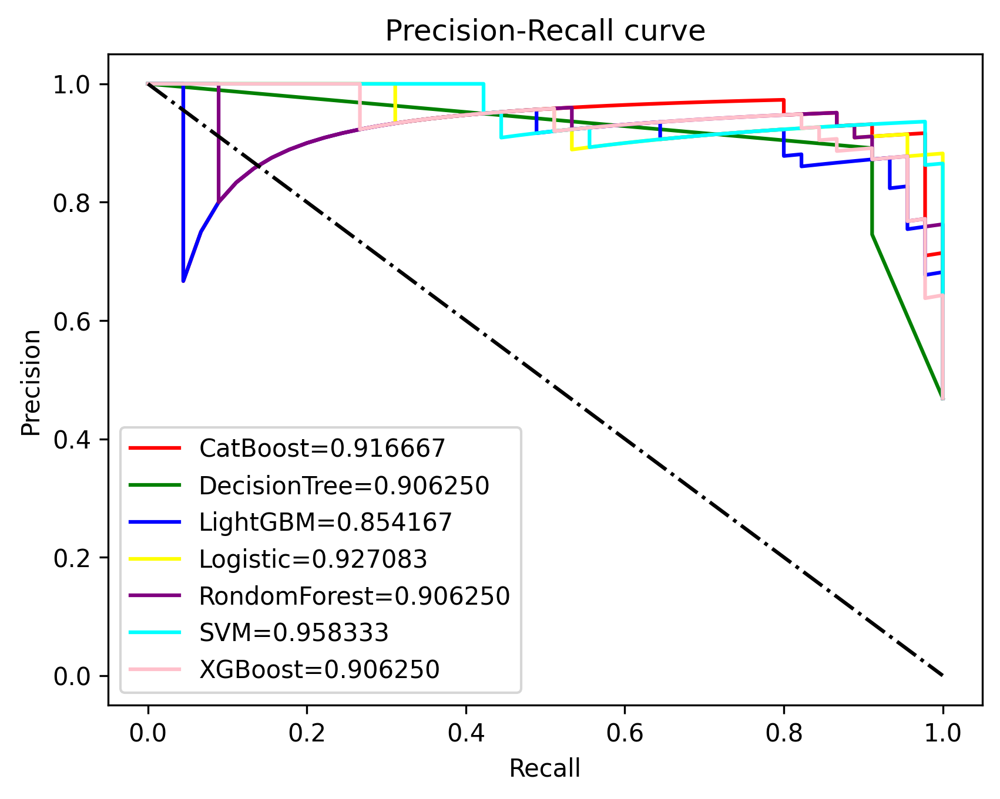

In [26]:
#绘制PR曲线
import matplotlib.pyplot as plt
PR_curve=plt.figure(dpi=300)
PR_ax=PR_curve.add_subplot(111)
PR_ax.set_title('Precision-Recall curve')
PR_ax.plot(CatBoost_PR['recall'], CatBoost_PR['precision'],color='red',label='CatBoost=%f'%CatBoost_Accuracy)
PR_ax.plot(DTC_PR['recall'], DTC_PR['precision'],color='green',label='DecisionTree=%f'%DTC_Accuracy)
PR_ax.plot(LightGBM_PR['recall'], LightGBM_PR['precision'],color='blue',label='LightGBM=%f'%LightGBM_Accuracy)
PR_ax.plot(Logistic_PR['recall'], Logistic_PR['precision'],color='yellow',label='Logistic=%f'%Logistic_Accuracy)
PR_ax.plot(RondomForest_PR['recall'], RondomForest_PR['precision'],color='purple',label='RondomForest=%f'%RondomForest_Accuracy)
PR_ax.plot(SVM_PR['recall'], SVM_PR['precision'],color='cyan',label='SVM=%f'%SVM_Accuracy)
PR_ax.plot(XGBoost_PR['recall'], XGBoost_PR['precision'],color='pink',label='XGBoost=%f'%XGBoost_Accuracy)
PR_ax.plot([0,1],[1,0],linestyle='-.',color='black')
PR_ax.set_xlabel('Recall')  
PR_ax.set_ylabel('Precision')    
plt.legend(loc="best")  
plt.show()

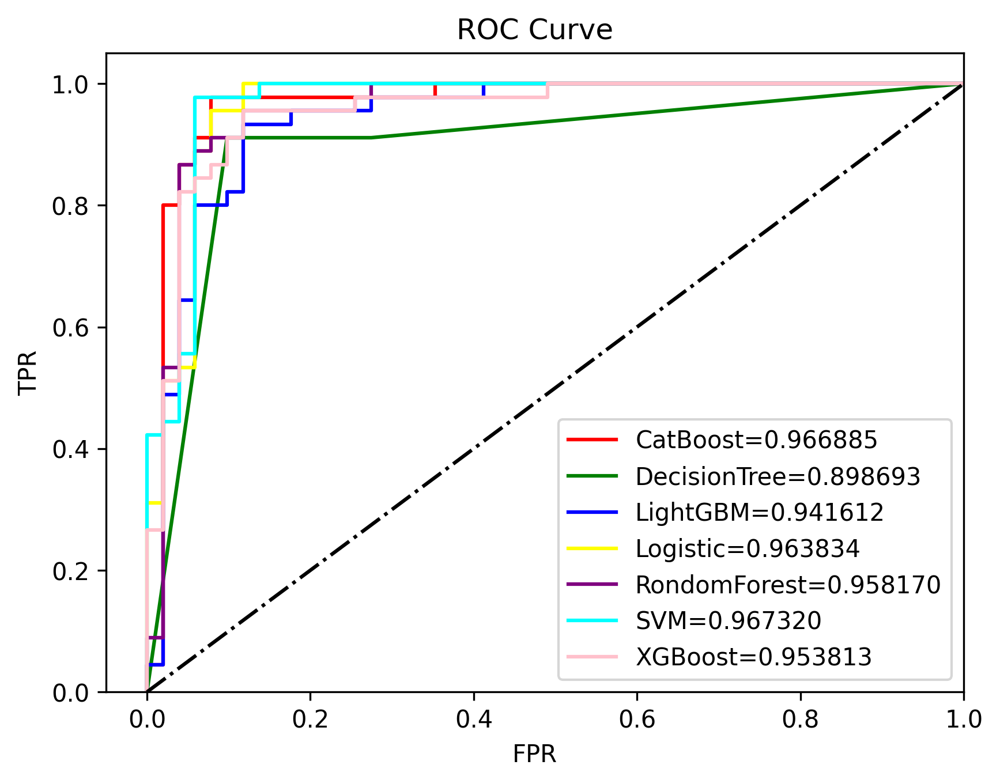

In [27]:
#绘制ROC曲线
import matplotlib.pyplot as plt
ROC_curve=plt.figure(dpi=300)
ROC_ax=ROC_curve.add_subplot(111)
ROC_ax.set_title('ROC Curve')
ROC_ax.plot(CatBoost_ROC['fpr'], CatBoost_ROC['tpr'],color='red',label='CatBoost=%f'%CatBoost_AUC)
ROC_ax.plot(DTC_ROC['fpr'], DTC_ROC['tpr'],color='green',label='DecisionTree=%f'%DTC_AUC)
ROC_ax.plot(LightGBM_ROC['fpr'], LightGBM_ROC['tpr'],color='blue',label='LightGBM=%f'%LightGBM_AUC)
ROC_ax.plot(Logistic_ROC['fpr'], Logistic_ROC['tpr'],color='yellow',label='Logistic=%f'%Logistic_AUC)
ROC_ax.plot(RondomForest_ROC['fpr'], RondomForest_ROC['tpr'],color='purple',label='RondomForest=%f'%RondomForest_AUC)
ROC_ax.plot(SVM_ROC['fpr'], SVM_ROC['tpr'],color='cyan',label='SVM=%f'%SVM_AUC)
ROC_ax.plot(XGBoost_ROC['fpr'], XGBoost_ROC['tpr'],color='pink',label='XGBoost=%f'%XGBoost_AUC)
ROC_ax.plot([0,1],[0,1],linestyle='-.',color='black')
ROC_ax.set_xlim([-0.05, 1.0])  
ROC_ax.set_ylim([0, 1.05])  
ROC_ax.set_xlabel('FPR')  
ROC_ax.set_ylabel('TPR')    
plt.legend(loc="best")  
plt.show()

In [28]:
#保存模型-输入[batchs,61],输出[batch,1]
import joblib
MLModel=[Logistic,SVM_Classifier,Best_DTC,Best_Forest,XGBoost,LightGBM,CatBoost]
MLModelStr=['Logistic.pkl','SVM.pkl','DecisionTree.pkl','Forest.pkl','XGBoost.pkl','LightGBM.pkl','CatBoost.pkl']
try:
    for model,modelstr in zip(MLModel,MLModelStr):
        joblib.dump(model,'/mnt/workspace/Analysis Model/Meachine Learning Models/'+modelstr)
    print('模型保存成功！')
except:
    print('模型保存异常！！！')

模型保存成功！


In [29]:
#执行PCA算法-计算保留95%信息时的维度
from sklearn.decomposition import PCA
PCA=PCA(n_components=0.95)
Methylation_95=PCA.fit_transform(MLRunData)    #数据降维
Methylation_95.shape

(318, 22)

In [31]:
#构建SHAP库解析数据集
from sklearn.model_selection import train_test_split
TrainDataSHAP,TestDataSHAP,TrainLabelSHAP,TestLabelSHAP=train_test_split(MLRunData,ReMLLabel,train_size=0.7,random_state=2025)  

In [32]:
#载入SHAP库计算SHAP值
import shap
SVMExplainer=shap.KernelExplainer(SVM_Classifier.predict, TestDataSHAP)
shap_values=SVMExplainer.shap_values(TestDataSHAP)

100%|██████████| 96/96 [06:58<00:00,  4.36s/it]


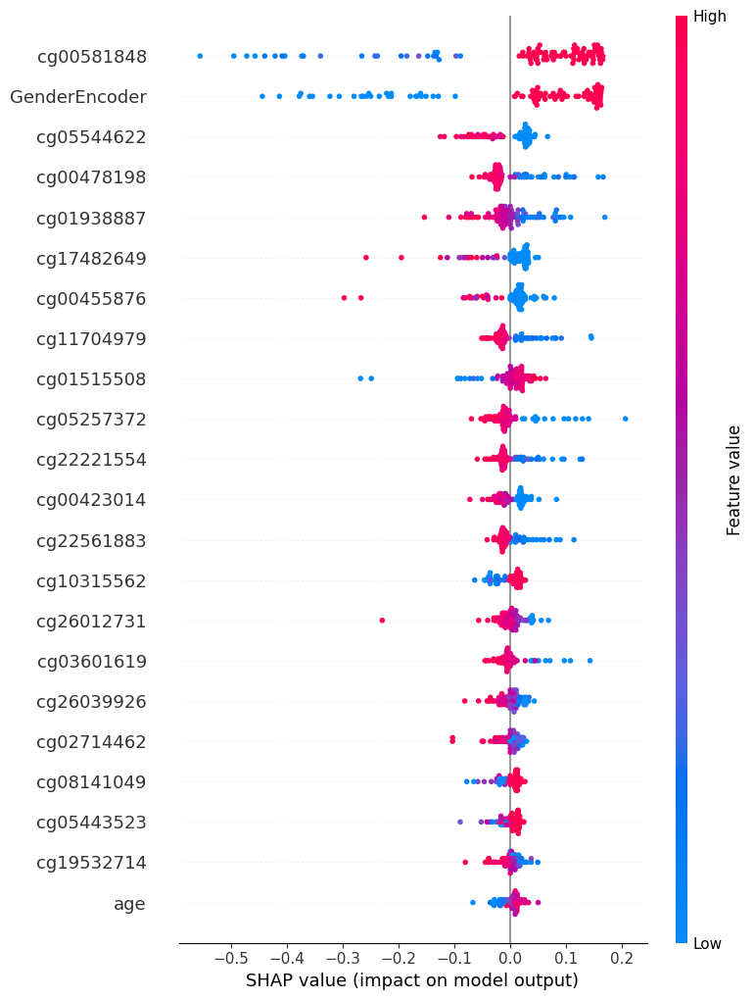

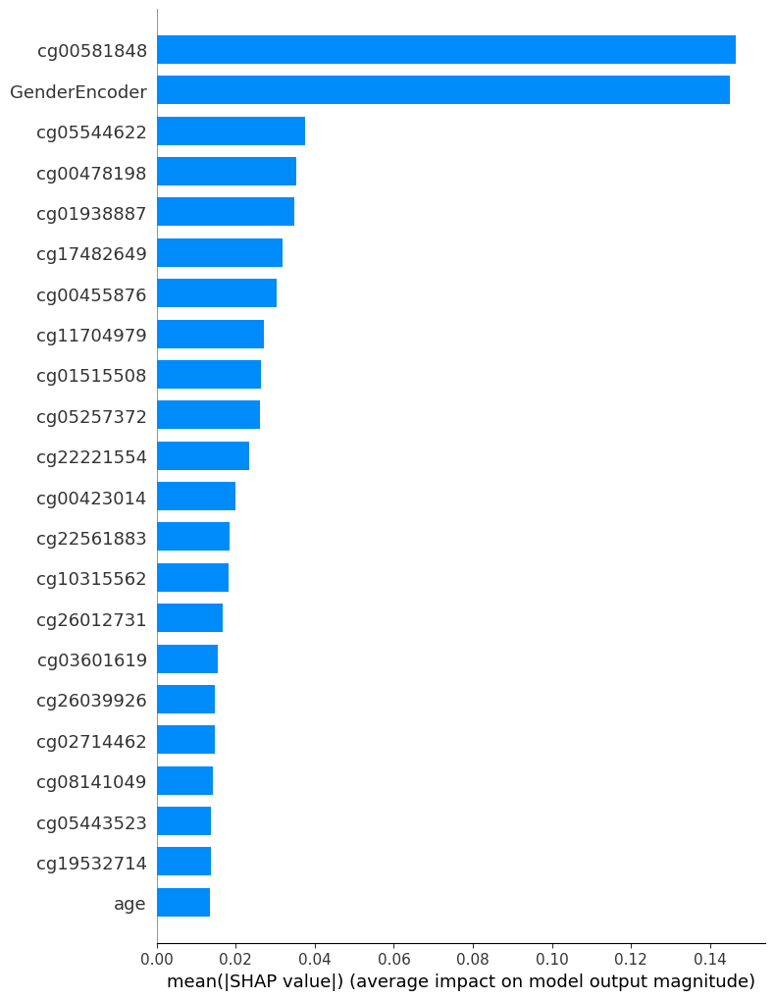

In [33]:
#绘制Summaryplot图
shap.summary_plot(shap_values,TestDataSHAP,max_display=22)
shap.summary_plot(shap_values,TestDataSHAP,max_display=22,plot_type='bar')

In [34]:
#绘制SHAP图
SHAP_ResFormer=(TestDataSHAP)

100%|██████████| 96/96 [07:01<00:00,  4.39s/it]


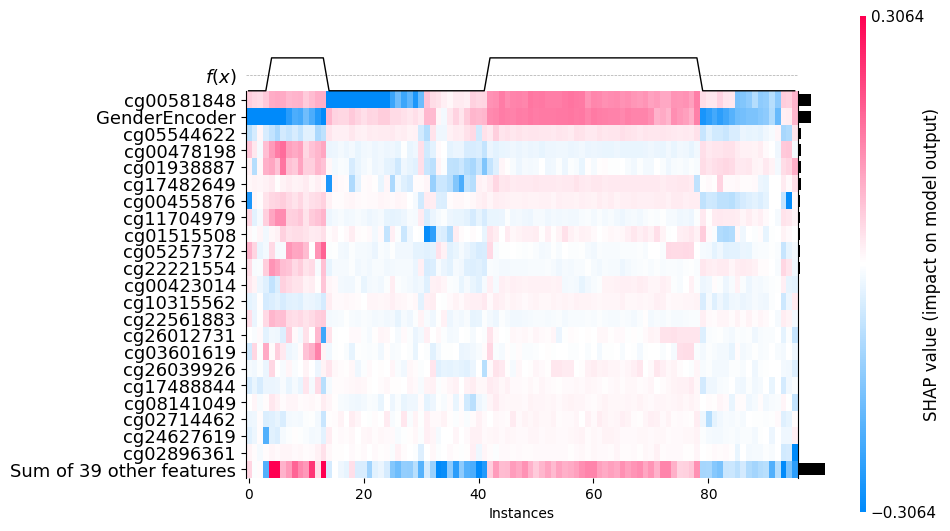

<Axes: xlabel='Instances'>

In [35]:
shap.plots.heatmap(SHAP_SVM,max_display=23)

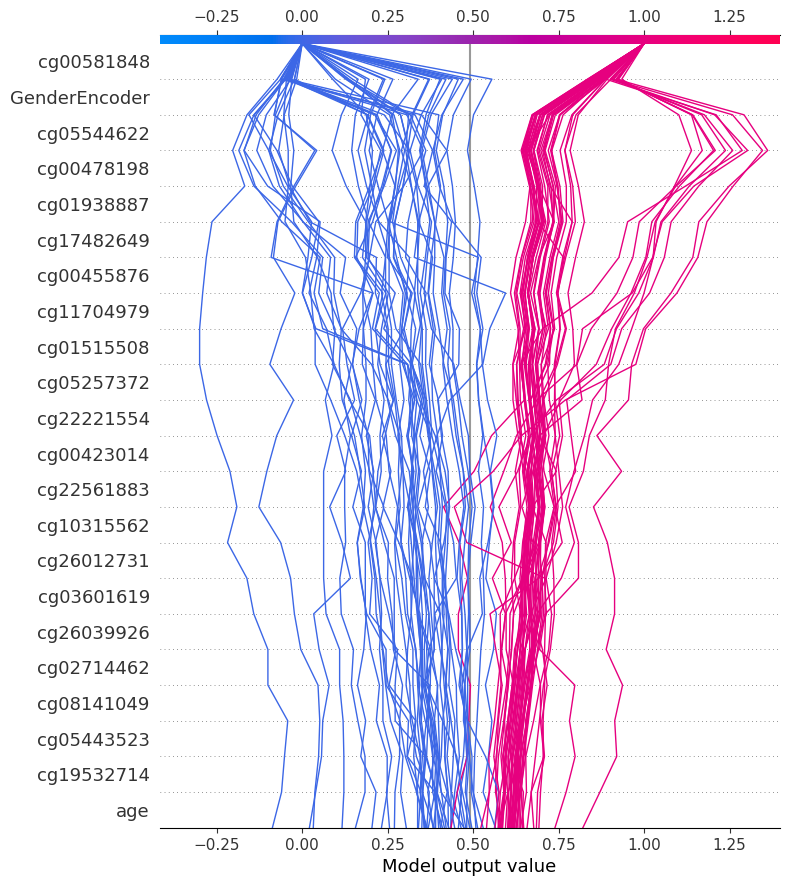

In [36]:
#绘制Decision图
expected_value=SVMExplainer.expected_value
shap.decision_plot(expected_value,shap_values,TestDataSHAP.columns,feature_display_range=slice(None, -23, -1))

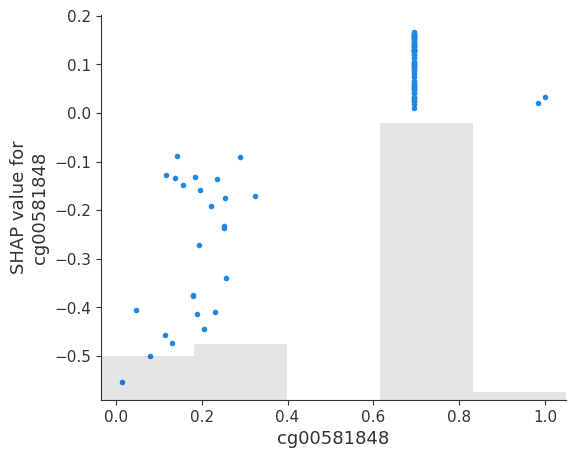

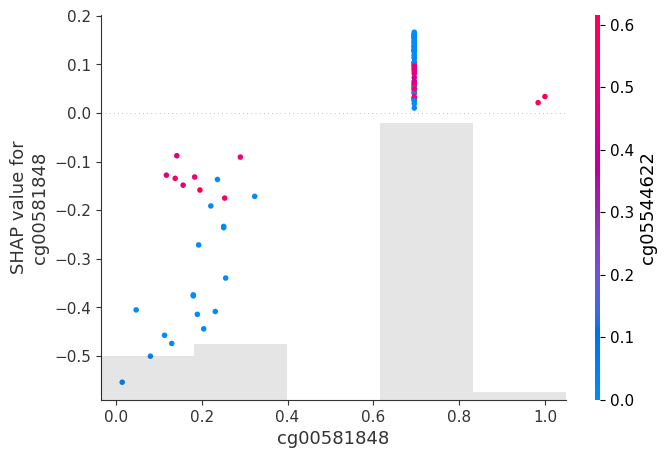

In [37]:
#绘制SHAP散点图
shap.plots.scatter(SHAP_SVM[:,'cg00581848'])
shap.plots.scatter(SHAP_SVM[:,'cg00581848'],color=SHAP_SVM)

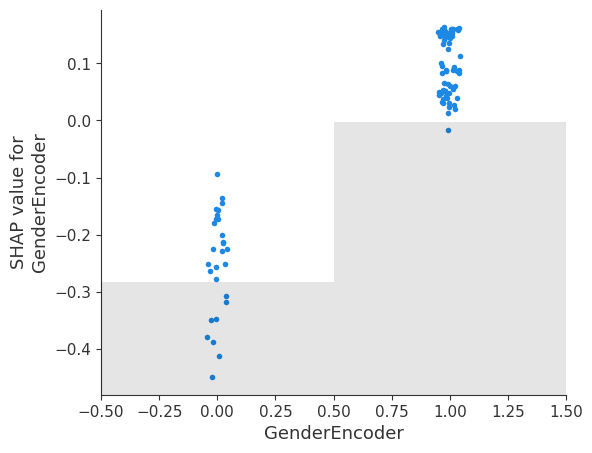

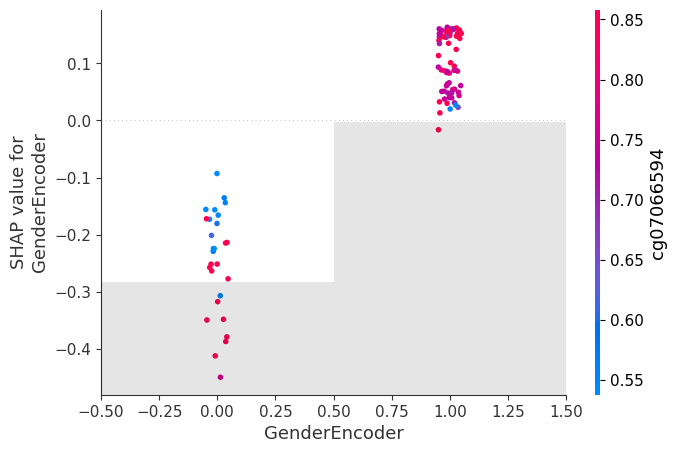

In [38]:
#绘制SHAP散点图-性别特异性
shap.plots.scatter(SHAP_SVM[:,'GenderEncoder'])
shap.plots.scatter(SHAP_SVM[:,'GenderEncoder'],color=SHAP_SVM)

In [ ]:
#输出SHAP值
SHAPData=DataFrame(shap_values)
SHAPData.to_excel('/mnt/workspace/Analysis Data/SVM_SHAP_Data.xlsx','UFT-8')
SHAPData.to_csv('/mnt/workspace/Analysis Data/SVM_SHAP_Data.csv')

使用LIME（Local Interpretable Model-agnostic Explanations）对SVM模型进行模型解释性。

In [ ]:
#转化为Numpy数组
import numpy as np
TestDataLIME=np.array(TestDataSHAP)
TestDataLIME

In [103]:
#构建LIME解释器
from lime.lime_tabular import LimeTabularExplainer
SVM_LIMEExplainer=LimeTabularExplainer(training_data=TestDataLIME,mode='classification',feature_names=TestDataSHAP.columns,class_names=[0,1], discretize_continuous=True)

In [104]:
#提取类风湿性关节炎患者和健康人数据——为数据生成解释
LIMEData=pd.concat([TestDataSHAP,TestLabelSHAP],axis=1)    #合并数据
Contral_Data=LIMEData.loc[LIMEData.loc[:,'DiseaseEncoder']==0,:]    #正常组数据
Contral_DataSample=Contral_Data.iloc[0,:-1]
RA_Data=LIMEData.loc[LIMEData.loc[:,'DiseaseEncoder']==1,:]    #正常组数据
RA_DataSample=RA_Data.iloc[0,:-1]

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

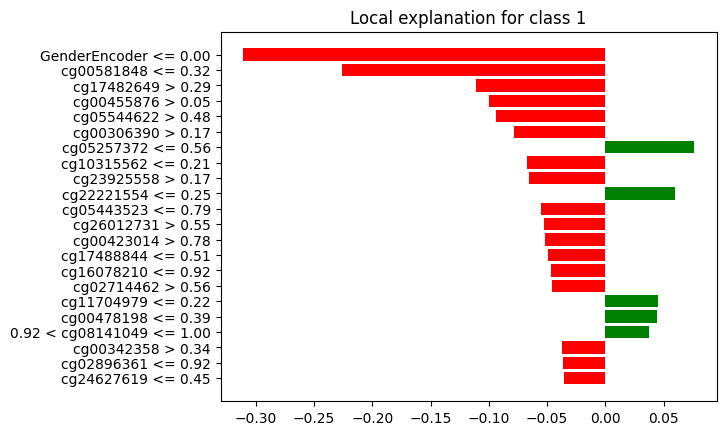

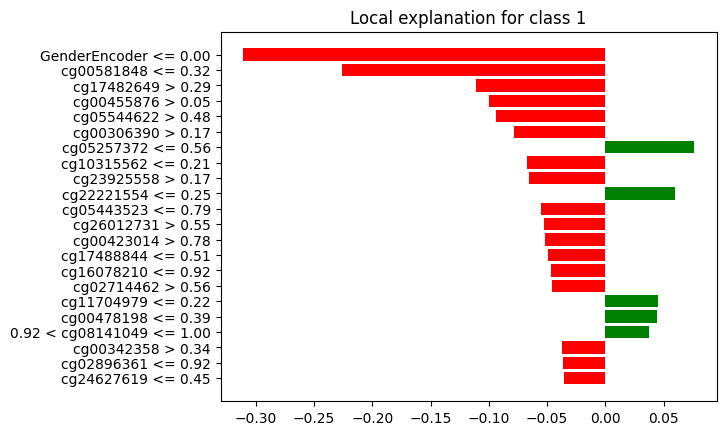

In [105]:
#为健康人生成可解释性
Contral_Explain=SVM_LIMEExplainer.explain_instance(Contral_DataSample,SVM_Classifier.predict_proba,num_features=22)
#可视化解释结果
Contral_Explain.show_in_notebook(show_table=True, show_all=False)
Contral_Explain.as_pyplot_figure()

/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
/usr/local/lib/python3.11/dist-packages/lime/lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

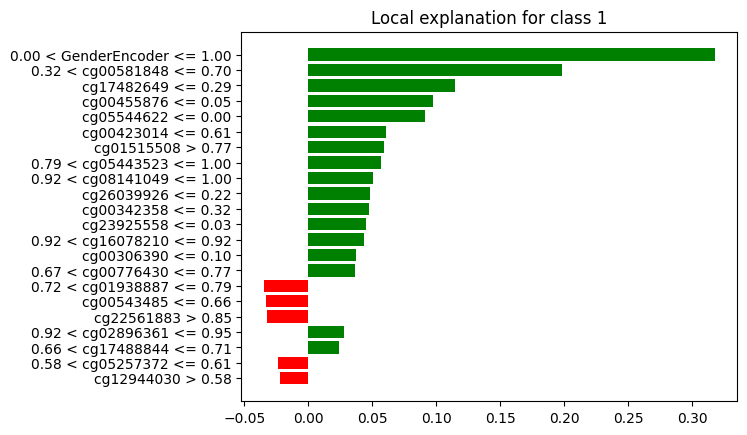

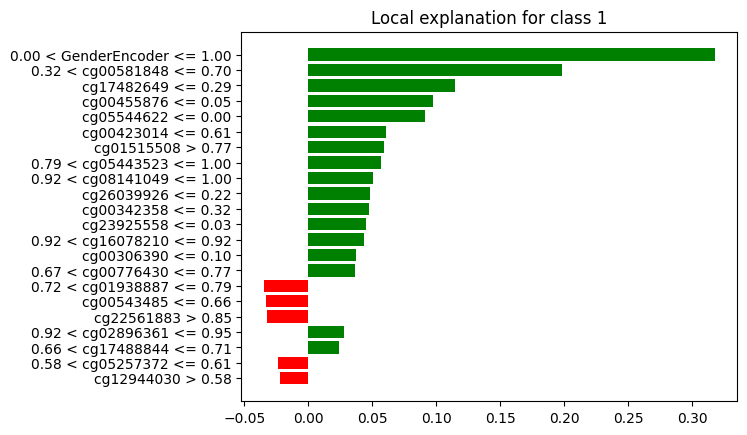

In [106]:
#为类风湿性关节炎患者生成可解释性
RA_Explain=SVM_LIMEExplainer.explain_instance(RA_DataSample,SVM_Classifier.predict_proba,num_features=22)
#可视化解释结果
RA_Explain.show_in_notebook(show_table=True, show_all=False)
RA_Explain.as_pyplot_figure()

提取SHAP方法和LIME方法提取的特征数据做交集获得候选特征。

In [111]:
#获取交 集数据
SHAP_Feature=['cg00581848','cg05544622','cg00478198','cg01938887','cg17482649','cg00455876','cg11704979','cg01515508',
             'cg05257372','cg22221554','cg00423014','cg22561883','cg10315562','cg26012731','cg03601619','cg26039926',
             'cg02714462','cg08141049','cg05443523','cg19532714','age','cg07066594']      #SHAP框架提取特征
LIME_Feature=['cg07066594','cg00581848','cg17482649','cg00455876','cg05544622','cg00423014','cg01515508','cg05443523',
             'cg08141049','cg26039926','cg00342358','cg23925558','cg16078210','cg00306390','cg00776430','cg01938887',
             'cg00543485','cg22561883','cg02896361','cg17488844','cg05257372','cg12944030']    #LIME提取特征
MethylationRA=set(SHAP_Feature)&set(LIME_Feature)    #计算交集
MethylationRA=list(MethylationRA)+['age','gender','disease','GenderEncoder','DiseaseEncoder']
MethylationRA

['cg05544622',
 'cg01938887',
 'cg07066594',
 'cg22561883',
 'cg00581848',
 'cg05443523',
 'cg05257372',
 'cg00455876',
 'cg17482649',
 'cg26039926',
 'cg00423014',
 'cg01515508',
 'cg08141049',
 'age',
 'gender',
 'disease',
 'GenderEncoder',
 'DiseaseEncoder']

对交集DNA甲基化位点数据进行统计学分析，主要包括：正态检验、差异分析和相关分析。

In [112]:
#获取统计学数据
StatsData=MethylationData.loc[:,MethylationRA]
StatsData.shape

(318, 18)

In [136]:
#首先进行正态性分析
from scipy.stats import normaltest
CGList=['cg05544622','cg01938887','cg07066594','cg22561883','cg00581848','cg05443523','cg05257372','cg00455876',
                         'cg17482649','cg26039926','cg00423014','cg01515508','cg08141049','age']
NormalCG,NormalStats,NormalPvalue=[],[],[]
for cg in CGList:
    CGData=StatsData.loc[:,cg]    #提取数据
    normalstats,normalpvalue=normaltest(CGData)    #正态检验
    NormalCG.append(cg)
    NormalStats.append(normalstats)
    NormalPvalue.append(normalpvalue)
NormalResult=DataFrame()
NormalResult['Feature']=NormalCG
NormalResult['Normal Stats']=NormalStats
NormalResult['Normal P value']=NormalPvalue
NormalResult=NormalResult.sort_values('Normal P value',ascending=True)
NormalResult

,Feature,Normal Stats,Normal P value
3,cg22561883,45397.441686,0.000000e+00
0,cg05544622,748.223251,3.352629e-163
12,cg08141049,388.753626,3.830210e-85
8,cg17482649,234.045003,1.505821e-51
9,cg26039926,230.466573,9.011967e-51
7,cg00455876,204.595818,3.737512e-45
5,cg05443523,169.865790,1.300506e-37
11,cg01515508,153.367553,4.973465e-34
10,cg00423014,148.633679,5.304039e-33
2,cg07066594,122.553661,2.442366e-27


In [137]:
#输出正态检验结果
NormalResult.to_excel('/mnt/workspace/Analysis Data/Stats Results/NormalResult.xlsx','UTF-8')
NormalResult.to_csv('/mnt/workspace/Analysis Data/Stats Results/NormalResult.csv')

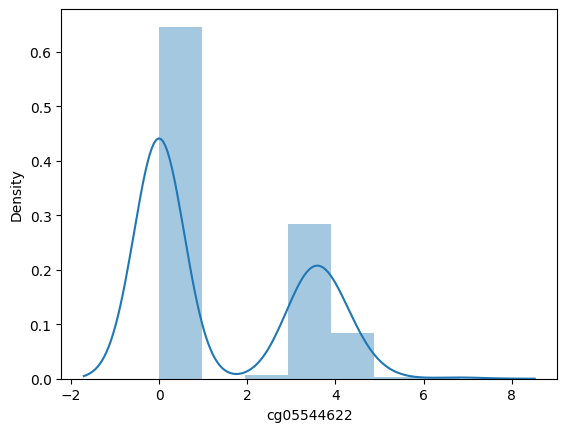

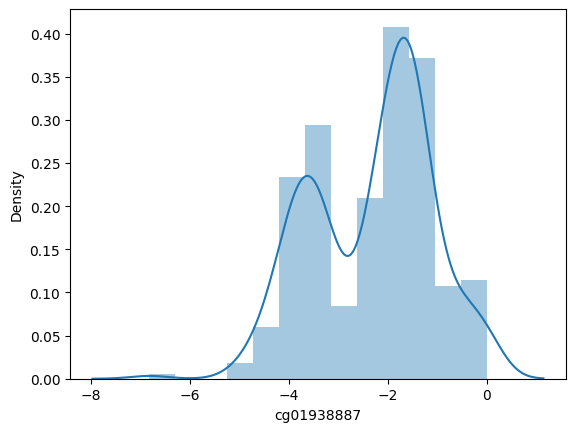

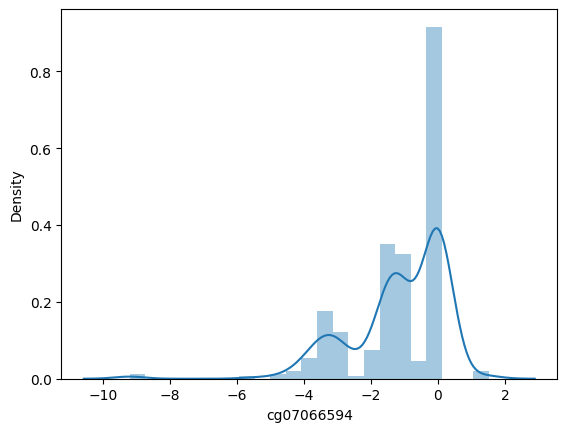

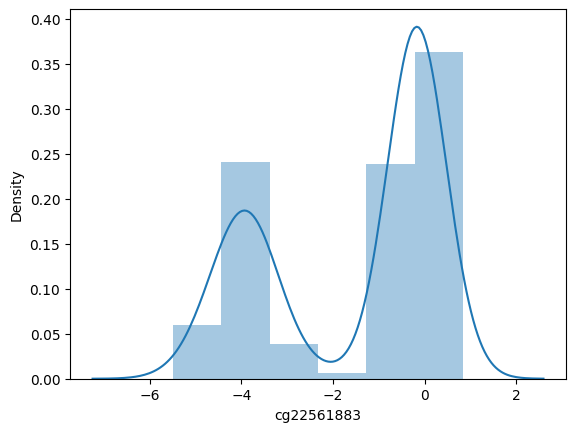

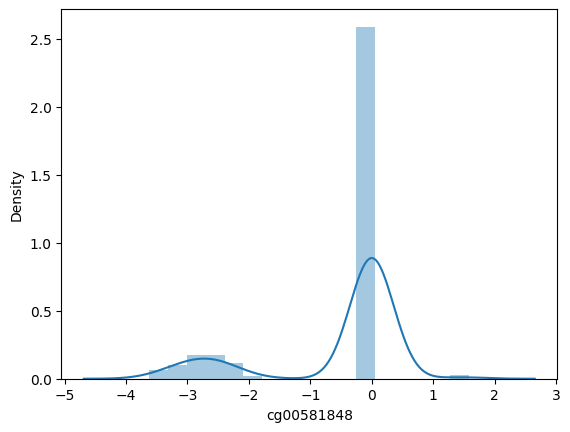

...

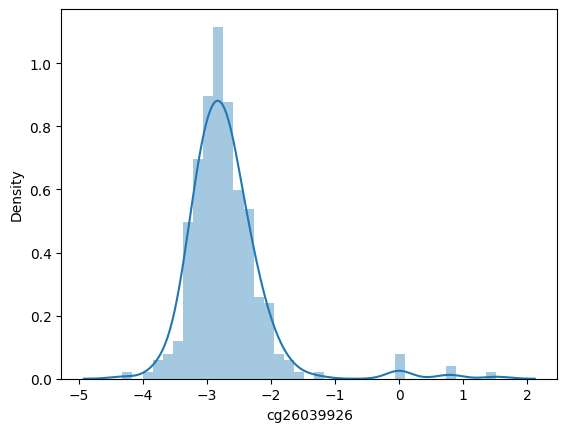

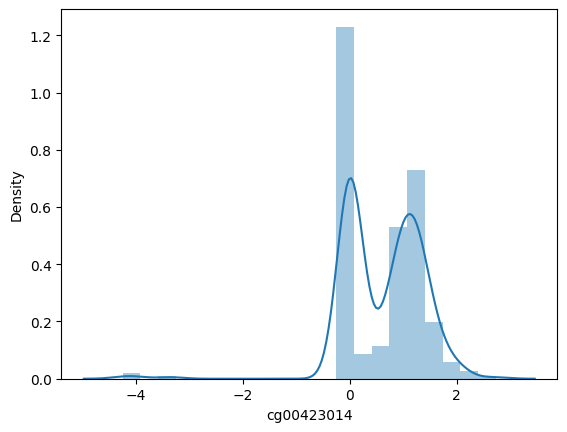

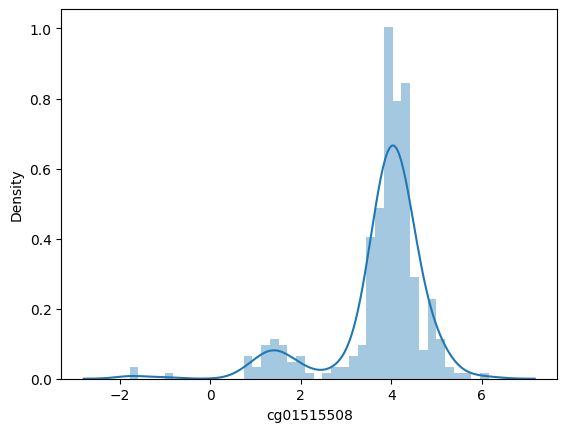

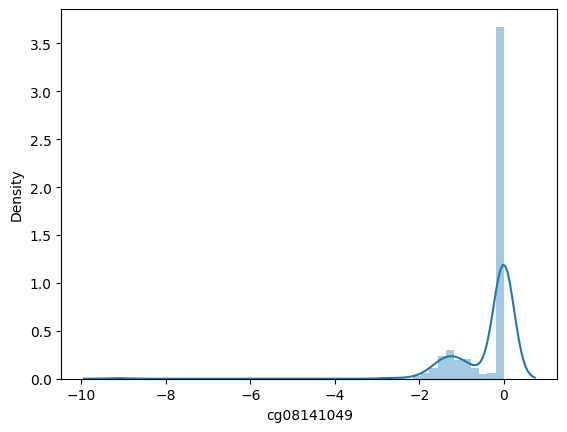

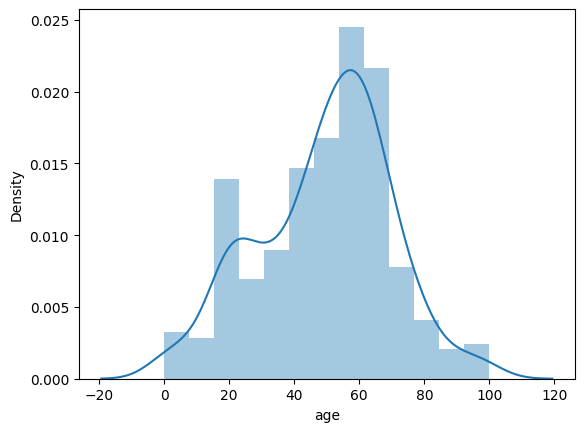

In [138]:
#查看数据分布
import seaborn as sns
for cg in CGList:
    kde=plt.figure()
    sns.distplot(StatsData.loc[:,cg])
    plt.show()

In [139]:
#以是否发生类风湿性关节炎分组进行差异分析
#使用Mann-Whitney U和Kruskal-Wallis H进行差异分析
from scipy.stats import mannwhitneyu,kruskal
Diff_name,Mann_W_stats,Mann_W_pvalue=[],[],[]
KW_Stats,KW_Pvalue=[],[]
RA=StatsData.loc[StatsData.loc[:,'disease']=='rheumatoid arthritis',:]
Control=StatsData.loc[StatsData.loc[:,'disease']=='control',:]
for name in CGList:
    mann_stats,mann_pvalue=mannwhitneyu(RA.loc[:,name],Control.loc[:,name],alternative='two-sided')
    Diff_name.append(name)
    Mann_W_stats.append(mann_stats)
    Mann_W_pvalue.append(mann_pvalue)
    kw_stats,kw_pvalue=kruskal(RA.loc[:,name],Control.loc[:,name])
    KW_Stats.append(kw_stats)
    KW_Pvalue.append(kw_pvalue)
DiffResult=DataFrame()
DiffResult['CG']=Diff_name
DiffResult['Mann-Whitney U Stats']=Mann_W_stats
DiffResult['Mann-Whitney U Pvalue']=Mann_W_pvalue
DiffResult['Kruskal-Wallis H Stat']=KW_Stats
DiffResult['Kruskal-Wallis H Pvalue']=KW_Pvalue
DiffResult=DiffResult.sort_values('Mann-Whitney U Pvalue',ascending=True)
DiffResult

,CG,Mann-Whitney U Stats,Mann-Whitney U Pvalue,Kruskal-Wallis H Stat,Kruskal-Wallis H Pvalue
12,cg08141049,18348.5,1.423253e-18,77.375583,1.413519e-18
9,cg26039926,5909.5,2.189873e-16,67.433837,2.178774e-16
6,cg05257372,6207.5,3.556541e-15,61.940912,3.539194e-15
7,cg00455876,8289.5,2.437285e-14,58.156458,2.420782e-14
4,cg00581848,16820.0,6.371911e-13,51.741242,6.331863e-13
8,cg17482649,9202.0,1.038787e-09,37.261518,1.033031e-09
10,cg00423014,7932.5,2.694328e-09,35.400669,2.683947e-09
11,cg01515508,17054.5,7.118968e-08,29.038656,7.094835e-08
5,cg05443523,15647.0,4.901541e-07,25.310599,4.880197e-07
2,cg07066594,16273.5,3.926378e-06,21.306322,3.914385e-06


In [140]:
#输出差异分析结果
DiffResult.to_excel('/mnt/workspace/Analysis Data/Stats Results/DiffResult.xlsx','UTF-8')
DiffResult.to_csv('/mnt/workspace/Analysis Data/Stats Results/DiffResult.csv')

In [135]:
StatsData

,cg05544622,cg01938887,cg07066594,cg22561883,cg00581848,cg05443523,cg05257372,cg00455876,cg17482649,cg26039926,cg00423014,cg01515508,cg08141049,age,gender,disease,GenderEncoder,DiseaseEncoder
0,0.000000,-1.271175,-1.348848,-0.176421,-2.616463,-2.441207,3.938986,0.000000,0.000000,-2.749976,1.202370,3.701353,-0.866223,19.0000,F,control,1.0,0
1,0.000000,-1.130596,-1.495729,0.347383,-2.468664,-1.536363,3.938986,0.000000,0.900040,-3.052934,1.019899,3.543689,-1.265340,12.0000,F,control,1.0,0
2,0.000000,-1.168907,-0.553611,-0.196592,0.000000,-1.071863,3.580953,0.000000,0.856647,-3.228904,0.241113,1.557086,-0.575243,71.8192,F,control,1.0,0
3,4.178048,-2.921730,-3.201956,-3.701353,-2.732410,0.000000,3.472874,0.510719,0.000000,-2.664729,1.839820,4.178048,0.000000,23.0000,M,control,0.0,0
4,0.000000,-1.456115,-2.131436,0.011998,0.000000,0.000000,3.938986,0.000000,0.372163,-2.131436,0.837604,3.938986,-1.635580,84.0000,F,control,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
313,0.000000,-1.798190,-1.236447,-0.019997,0.000000,0.000000,3.580953,0.000000,0.000000,-2.963760,0.000000,4.402578,0.000000,34.0000,F,rheumatoid arthritis,1.0,1
314,3.659672,-4.112908,0.000000,-4.247583,0.000000,0.000000,0.000000,0.000000,0.000000,-2.253116,0.000000,3.993781,0.000000,51.0000,M,rheumatoid arthritis,0.0,1
315,0.000000,-2.163468,0.000000,-0.180452,0.000000,0.000000,3.343970,0.000000,0.000000,-3.343970,1.130596,3.472874,0.000000,45.0000,F,rheumatoid arthritis,1.0,1
316,0.000000,-1.578093,0.000000,-0.088039,0.000000,0.000000,3.256540,0.000000,0.000000,-2.767818,0.000000,4.178048,0.000000,31.0000,F,rheumatoid arthritis,1.0,1


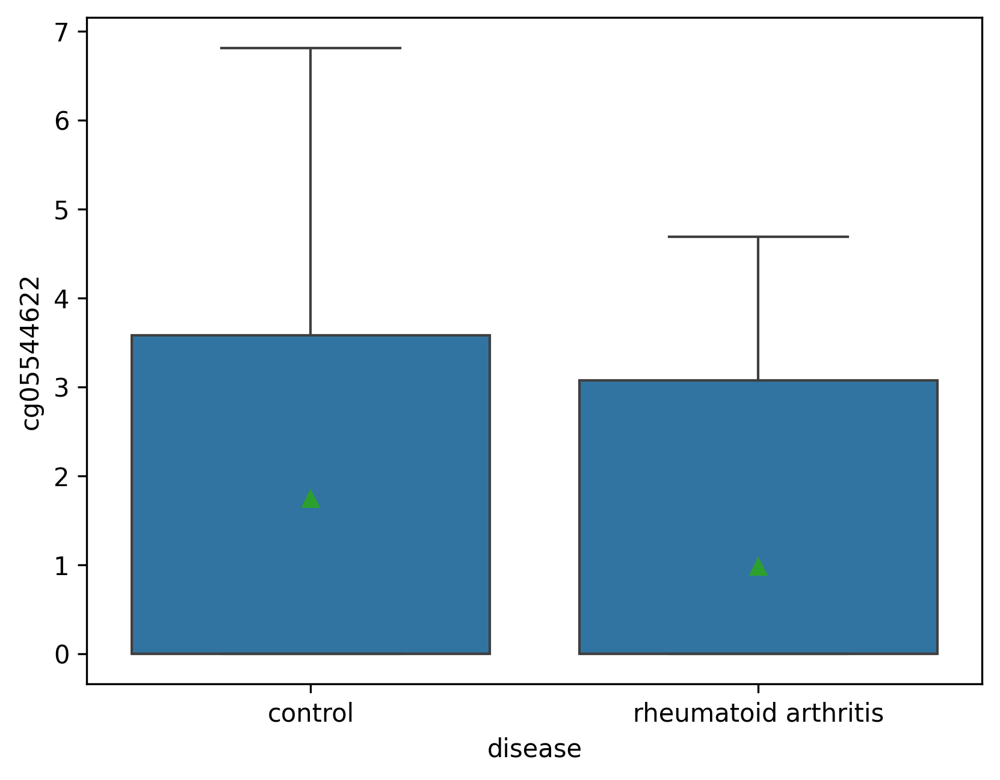

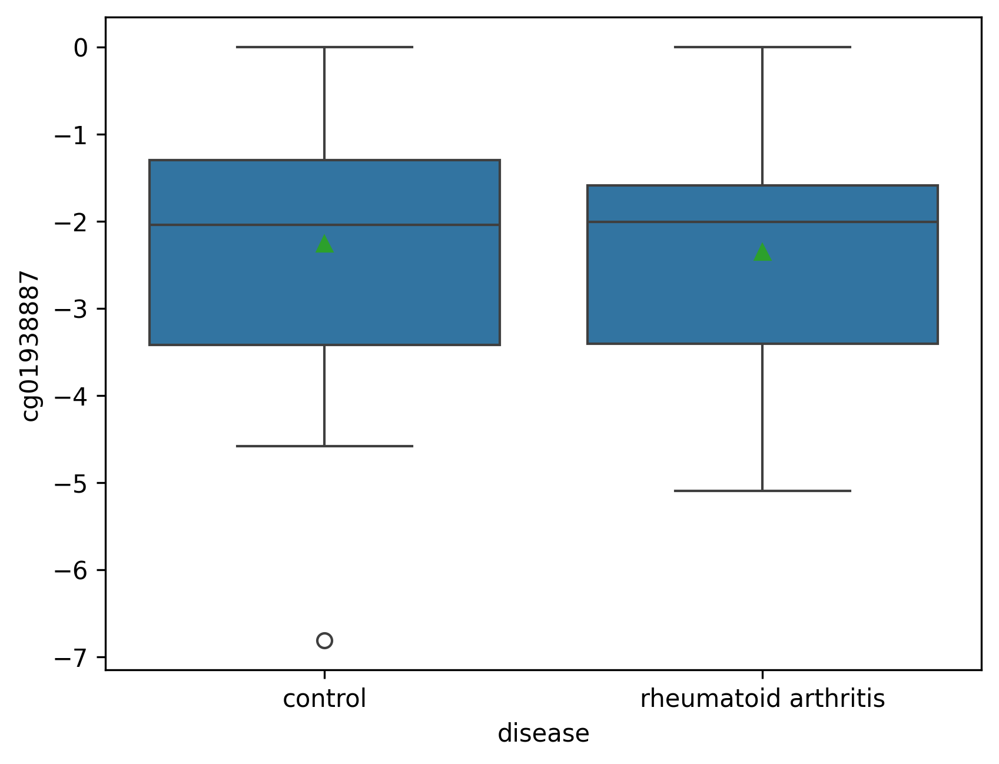

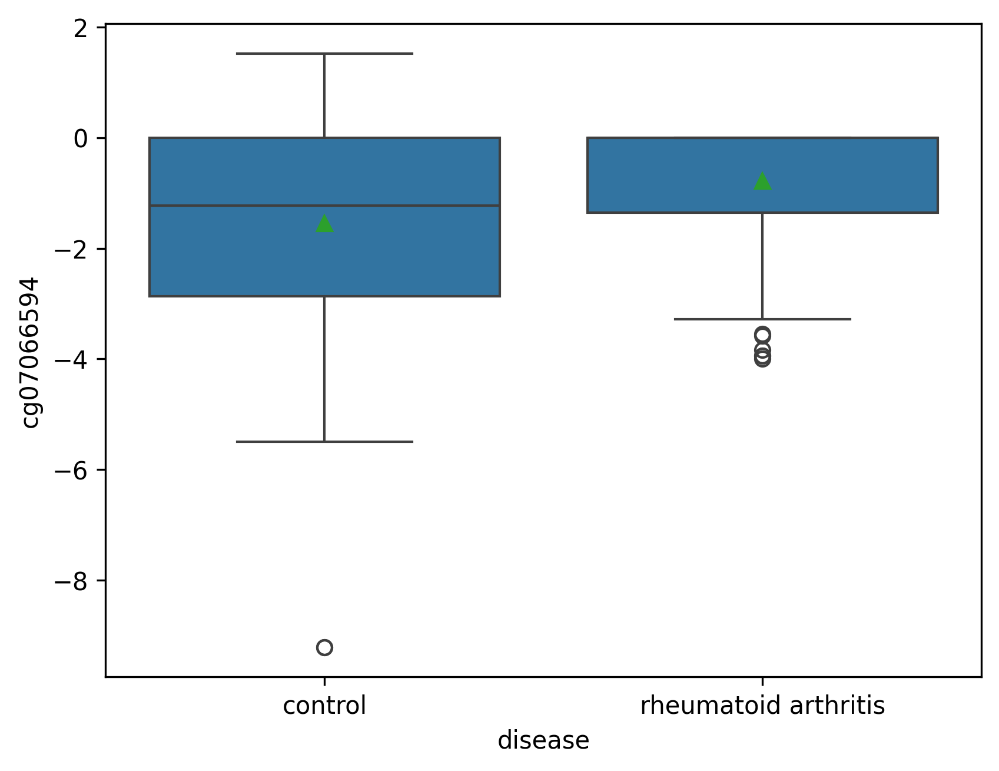

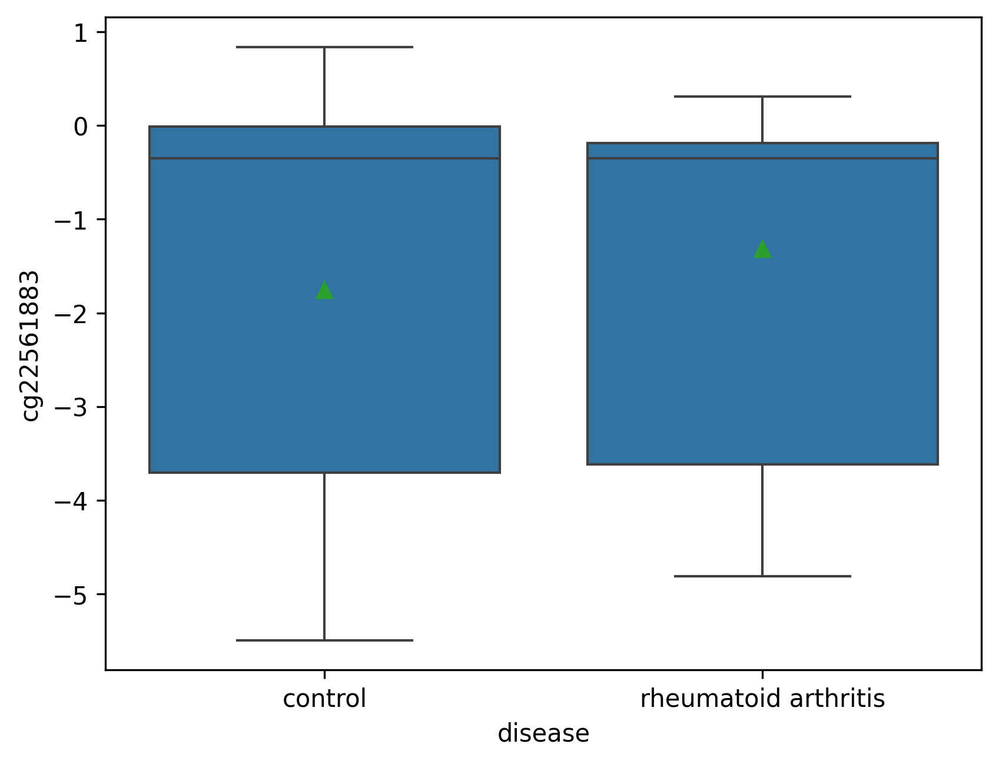

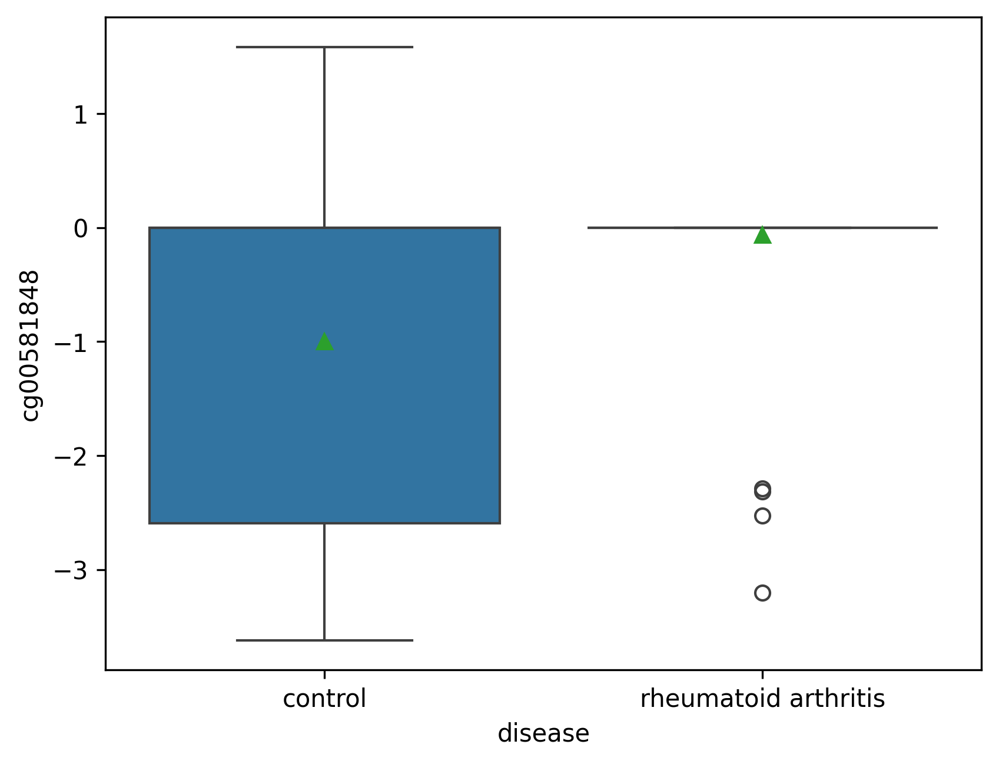

...

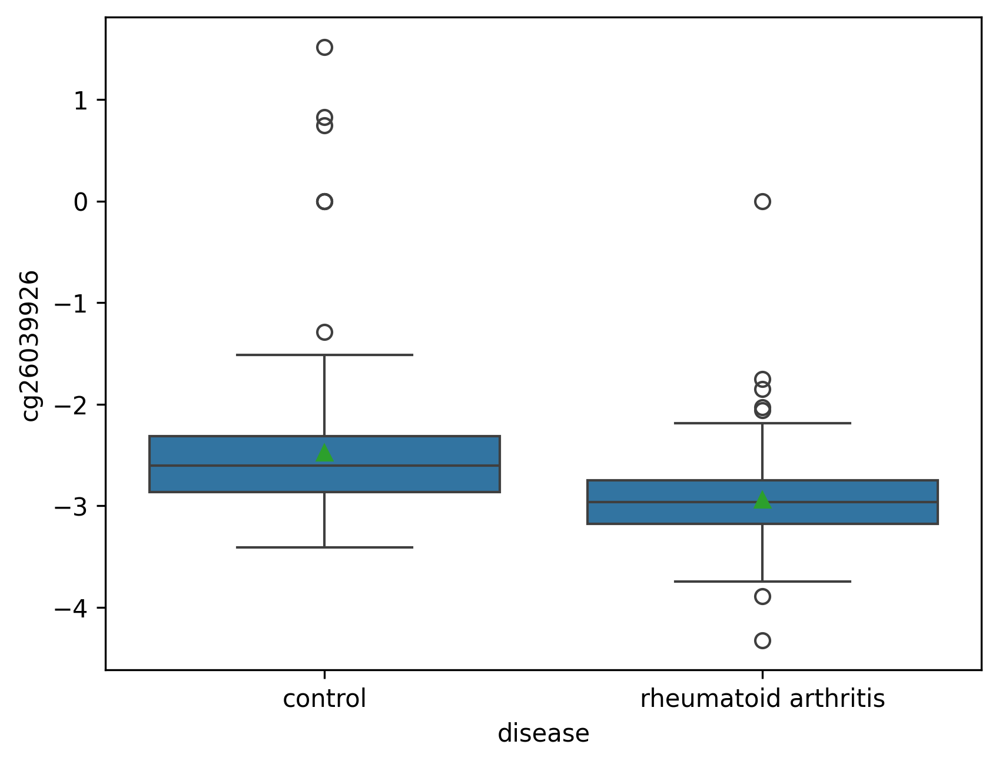

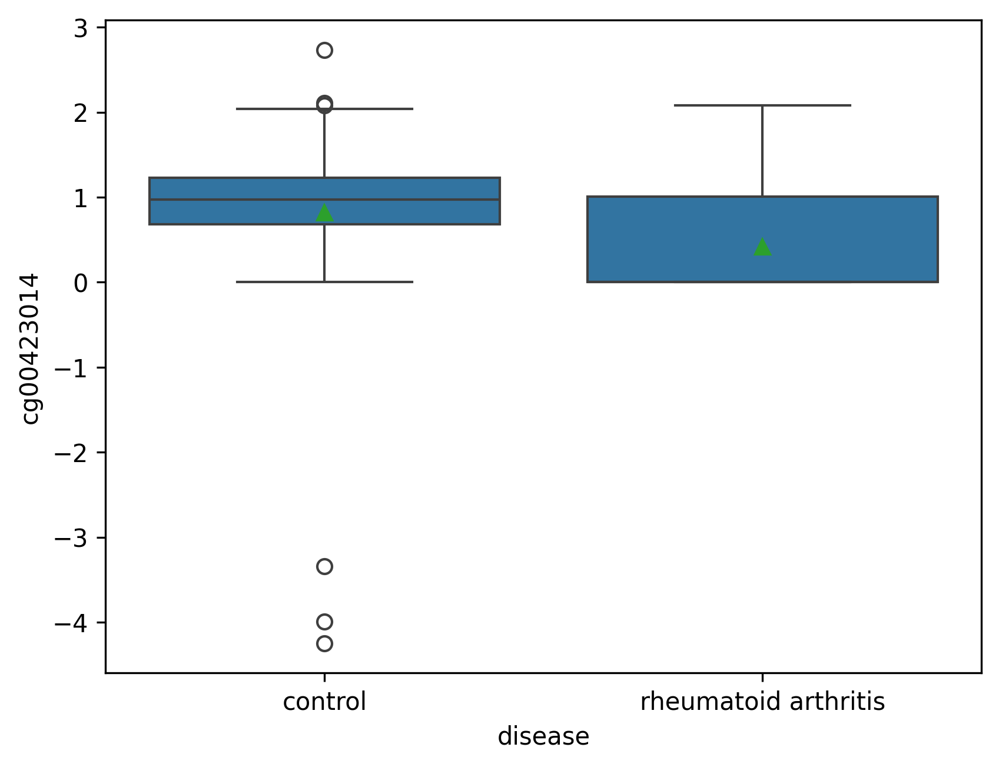

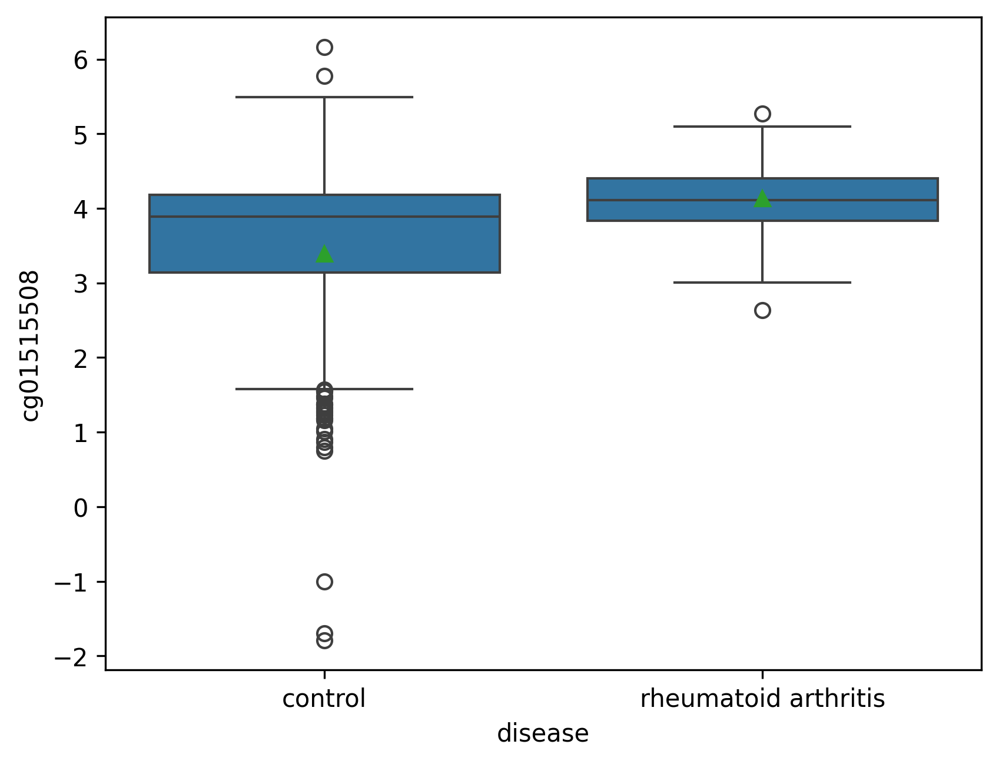

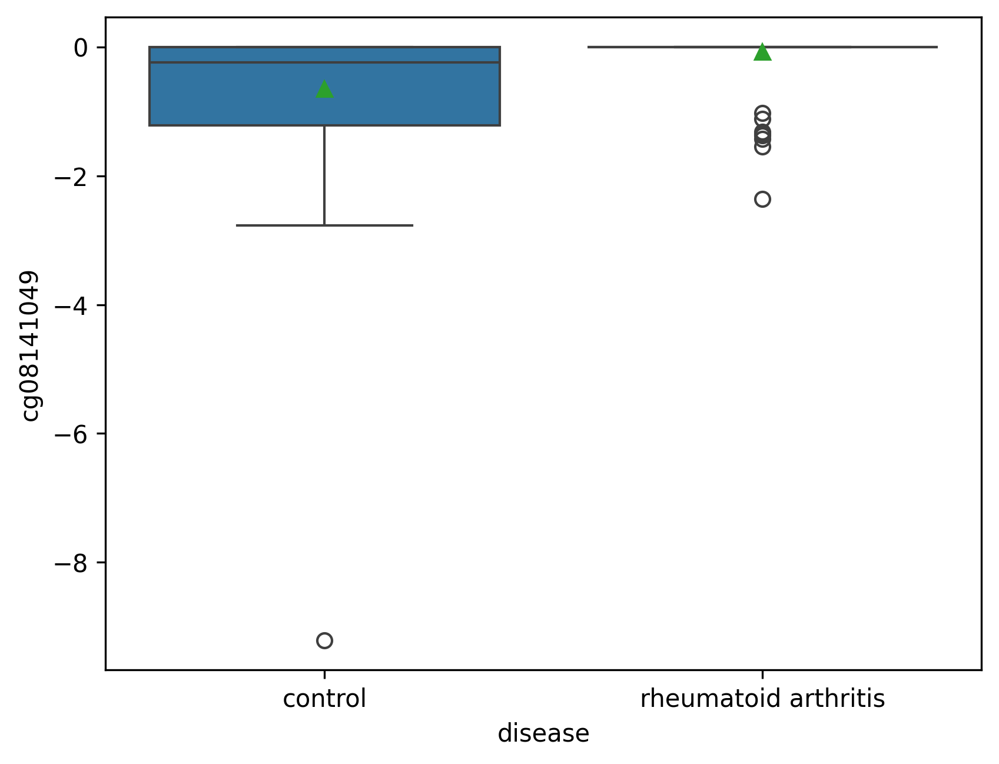

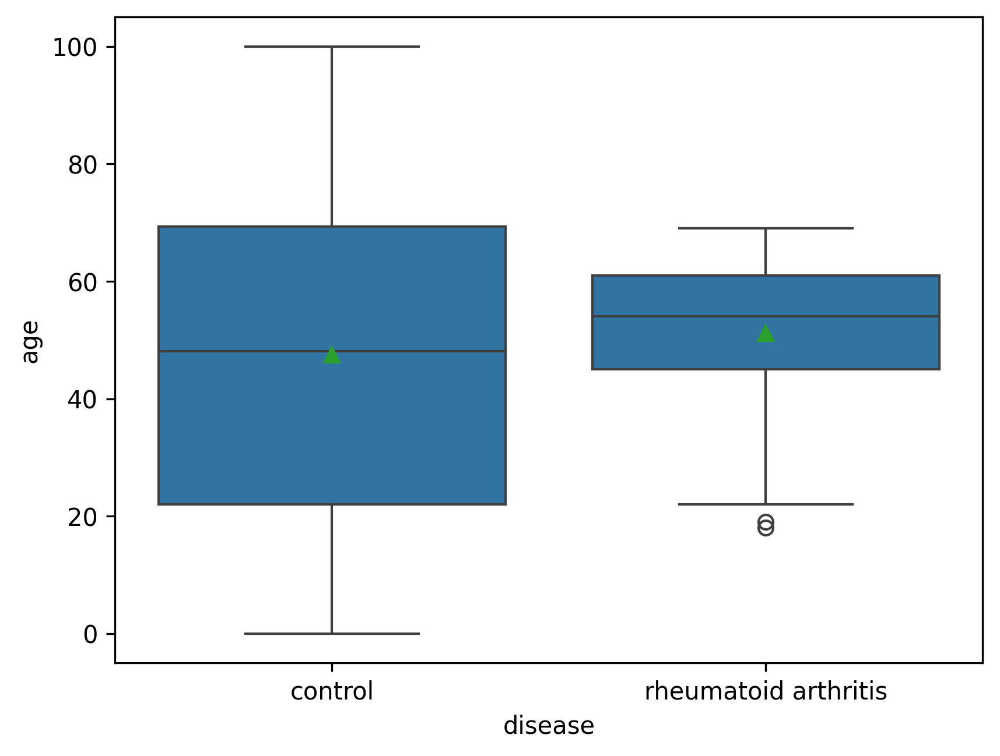

In [152]:
#绘制特异性数据箱型图
for names in CGList:
    plt.figure(dpi=300)
    sns.boxplot(StatsData,x='disease',y=names,showmeans=True)
    plt.show()

In [141]:
#以是类风湿性关节炎性别分组进行差异分析
#使用Mann-Whitney U和Kruskal-Wallis H进行差异分析
from scipy.stats import mannwhitneyu,kruskal
SexDiff_name,SexMann_W_stats,SexMann_W_pvalue=[],[],[]
SexKW_Stats,SexKW_Pvalue=[],[]
Man=RA.loc[RA.loc[:,'gender']=='M',:]
Feman=RA.loc[RA.loc[:,'gender']=='F',:]
for name in CGList:
    mann_stats,mann_pvalue=mannwhitneyu(Man.loc[:,name],Feman.loc[:,name],alternative='two-sided')
    SexDiff_name.append(name)
    SexMann_W_stats.append(mann_stats)
    SexMann_W_pvalue.append(mann_pvalue)
    kw_stats,kw_pvalue=kruskal(Man.loc[:,name],Feman.loc[:,name])
    SexKW_Stats.append(kw_stats)
    SexKW_Pvalue.append(kw_pvalue)
SexDiffResult=DataFrame()
SexDiffResult['CG']=SexDiff_name
SexDiffResult['Mann-Whitney U Stats']=SexMann_W_stats
SexDiffResult['Mann-Whitney U Pvalue']=SexMann_W_pvalue
SexDiffResult['Kruskal-Wallis H Stat']=SexKW_Stats
SexDiffResult['Kruskal-Wallis H Pvalue']=SexKW_Pvalue
SexDiffResult=DiffResult.sort_values('Mann-Whitney U Pvalue',ascending=True)
SexDiffResult

,CG,Mann-Whitney U Stats,Mann-Whitney U Pvalue,Kruskal-Wallis H Stat,Kruskal-Wallis H Pvalue
12,cg08141049,18348.5,1.423253e-18,77.375583,1.413519e-18
9,cg26039926,5909.5,2.189873e-16,67.433837,2.178774e-16
6,cg05257372,6207.5,3.556541e-15,61.940912,3.539194e-15
7,cg00455876,8289.5,2.437285e-14,58.156458,2.420782e-14
4,cg00581848,16820.0,6.371911e-13,51.741242,6.331863e-13
8,cg17482649,9202.0,1.038787e-09,37.261518,1.033031e-09
10,cg00423014,7932.5,2.694328e-09,35.400669,2.683947e-09
11,cg01515508,17054.5,7.118968e-08,29.038656,7.094835e-08
5,cg05443523,15647.0,4.901541e-07,25.310599,4.880197e-07
2,cg07066594,16273.5,3.926378e-06,21.306322,3.914385e-06


In [142]:
#输出差异分析结果
SexDiffResult.to_excel('/mnt/workspace/Analysis Data/Stats Results/SexDiffResult.xlsx','UTF-8')
SexDiffResult.to_csv('/mnt/workspace/Analysis Data/Stats Results/SexDiffResult.csv')

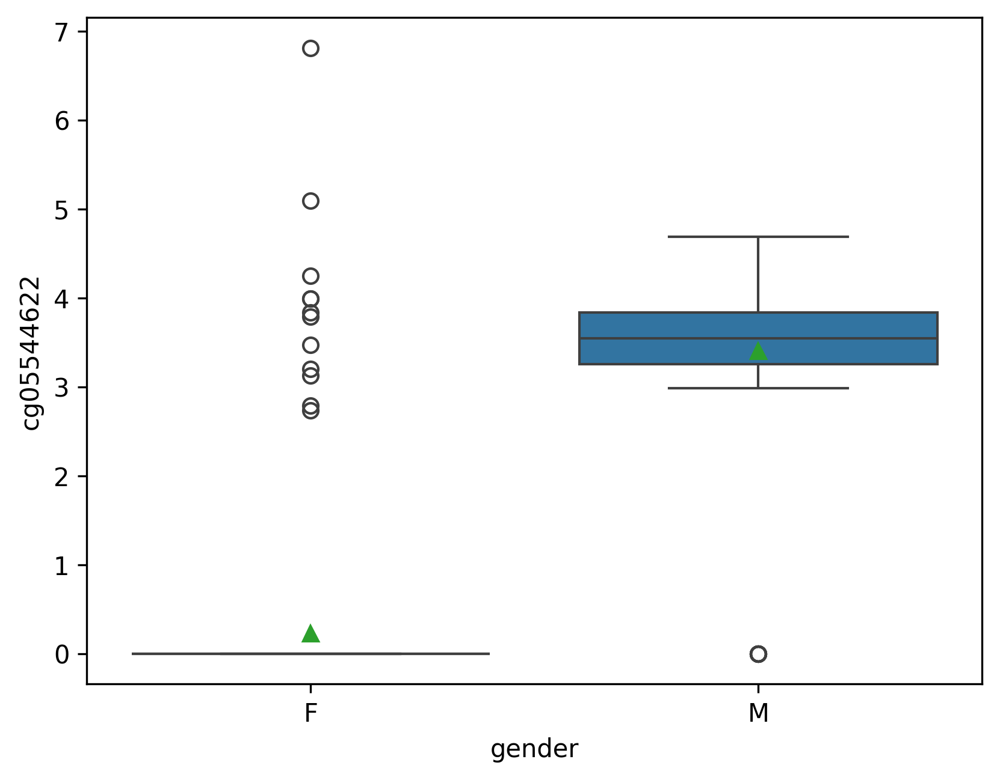

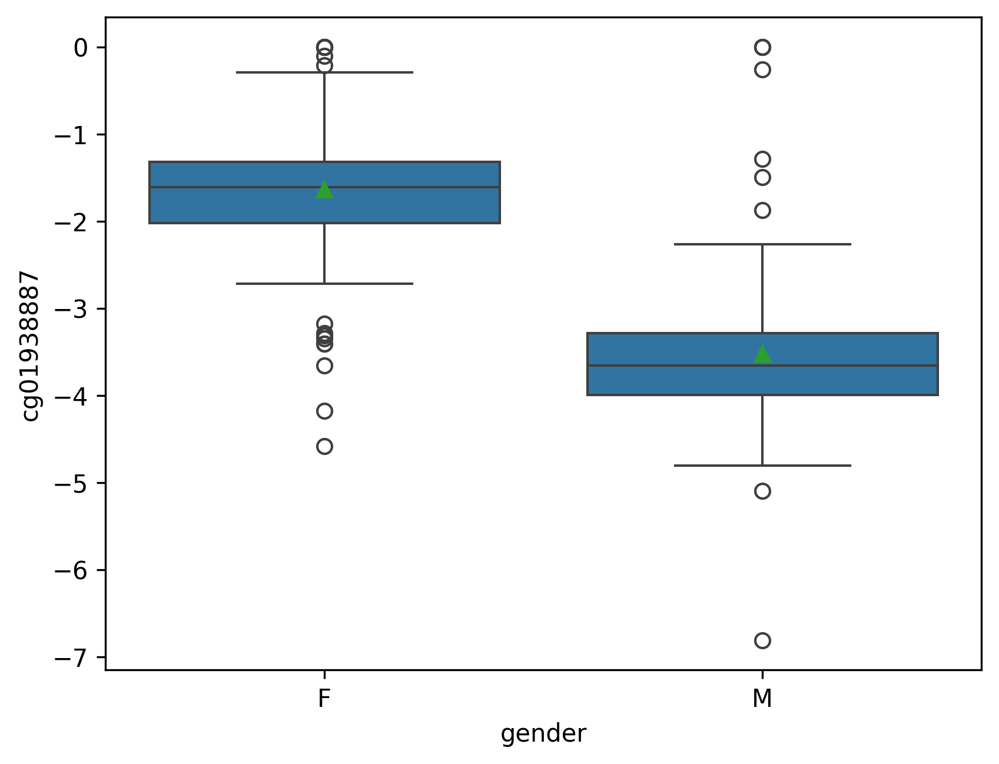

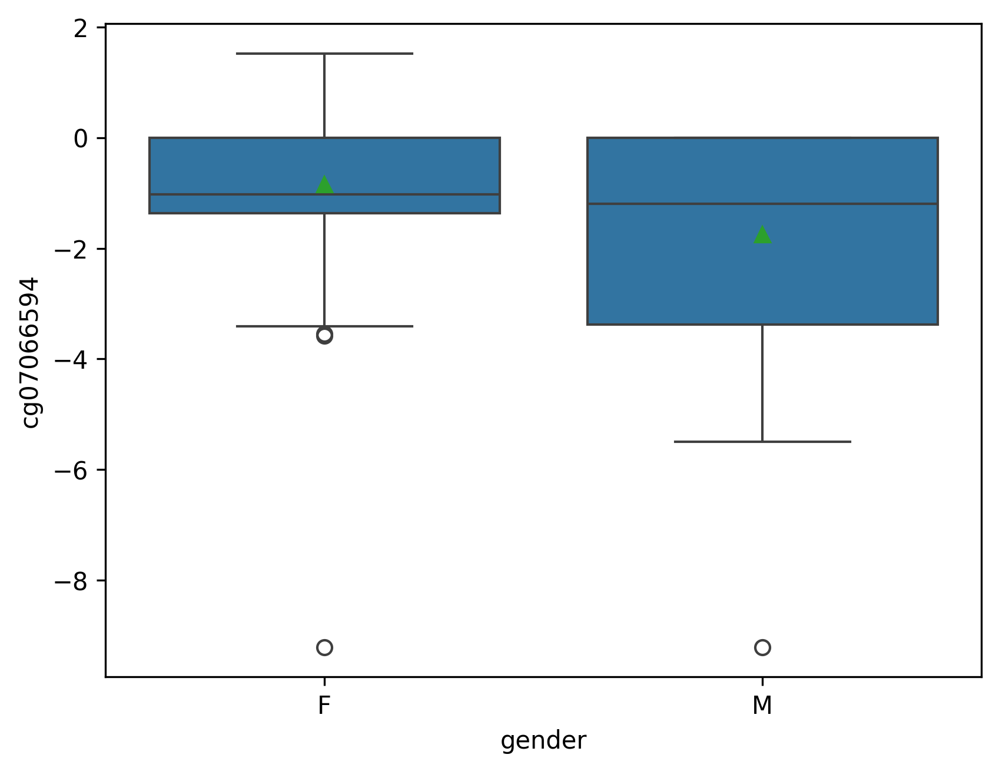

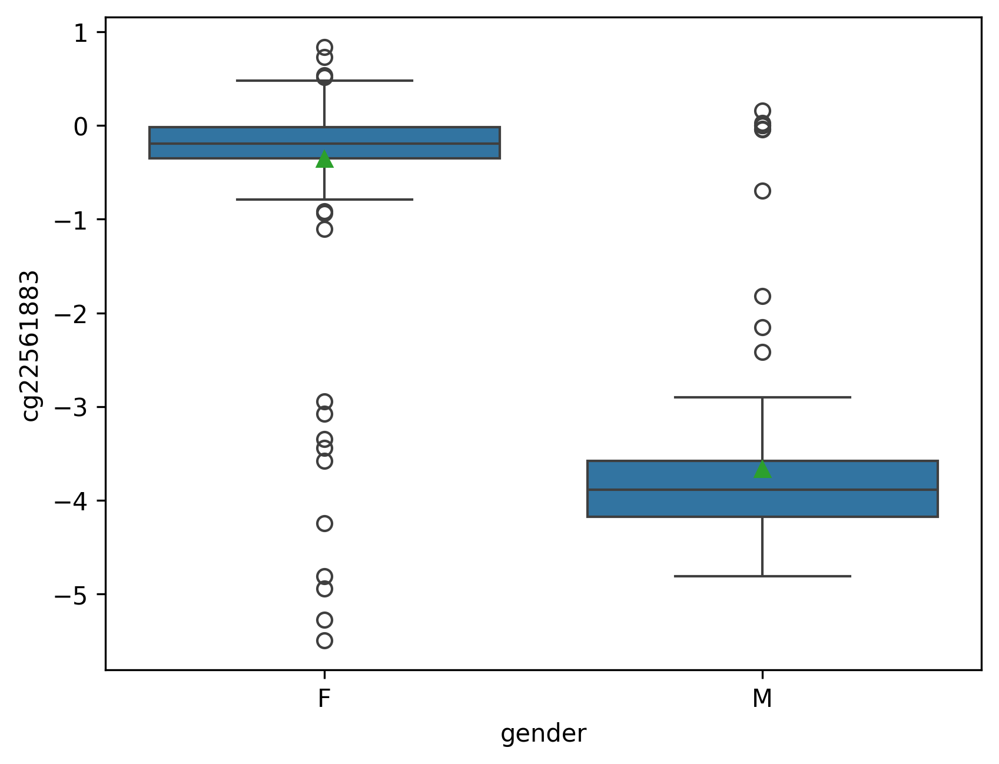

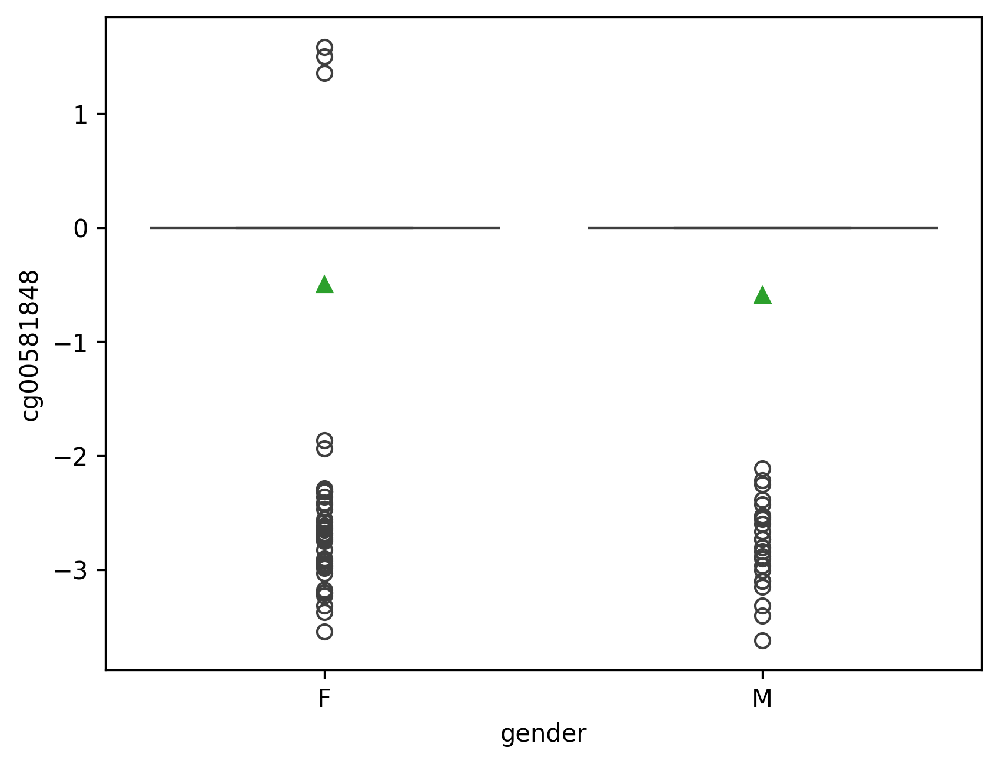

...

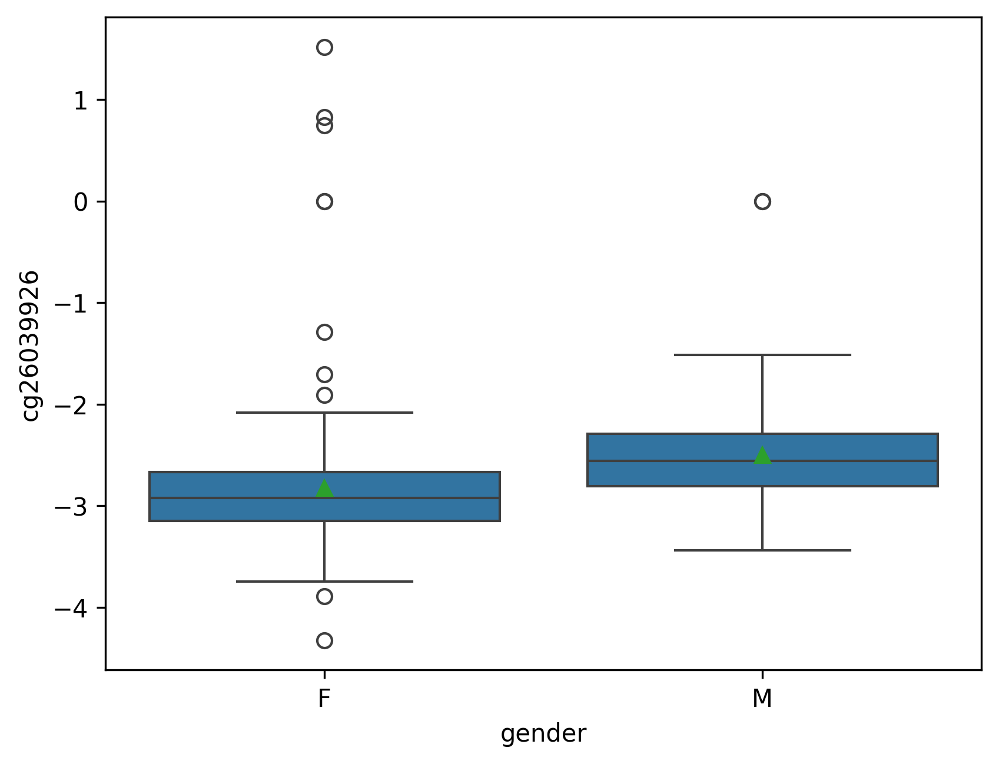

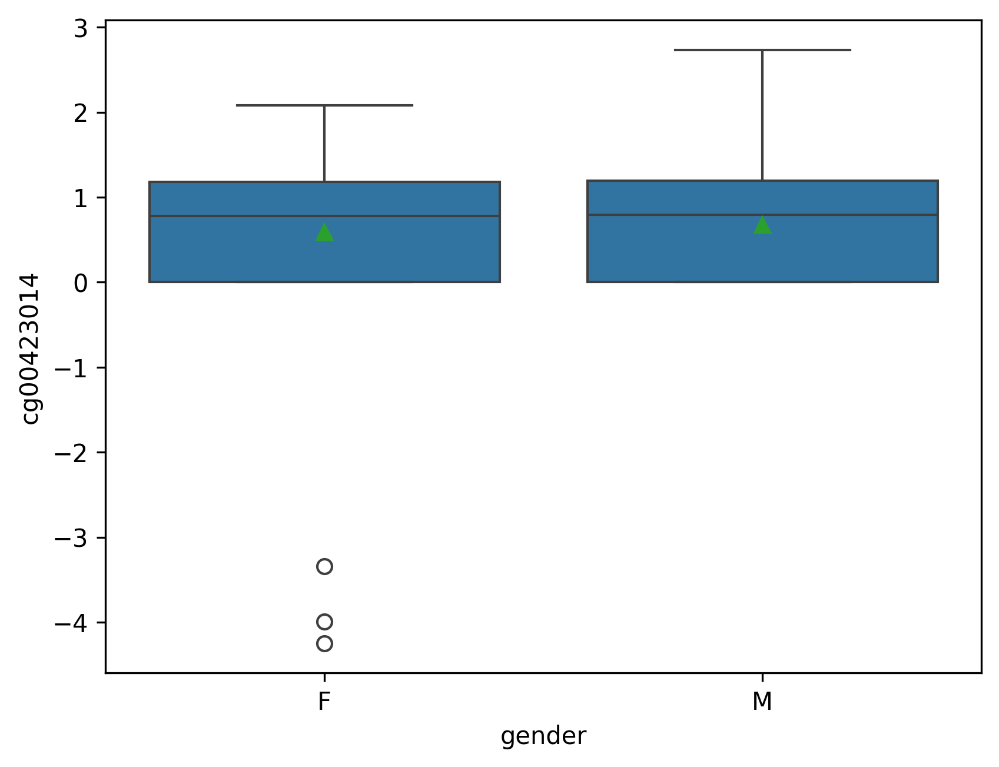

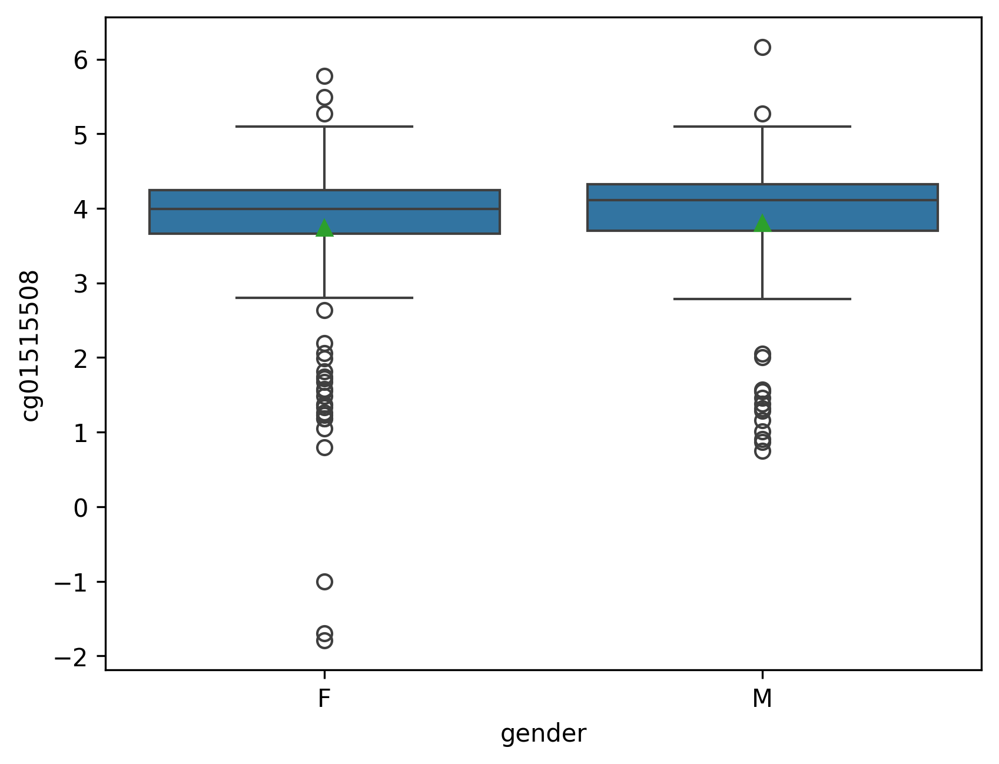

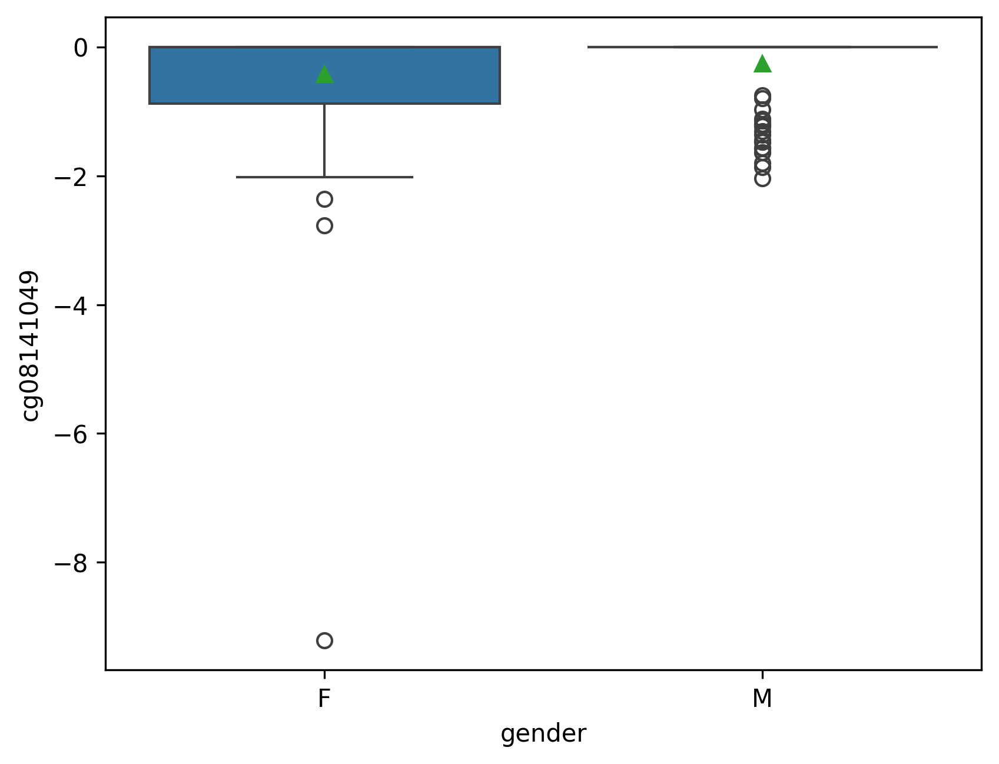

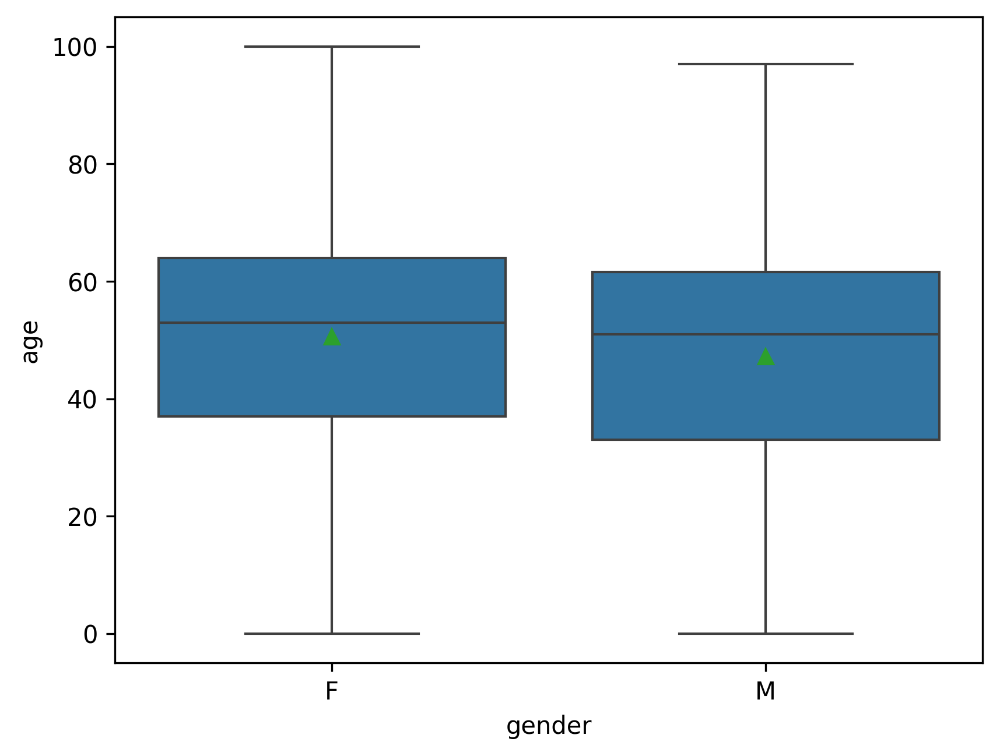

In [153]:
#绘制特异性数据箱型图
for names in CGList:
    plt.figure(dpi=300)
    sns.boxplot(StatsData,x='gender',y=names,showmeans=True)
    plt.show()

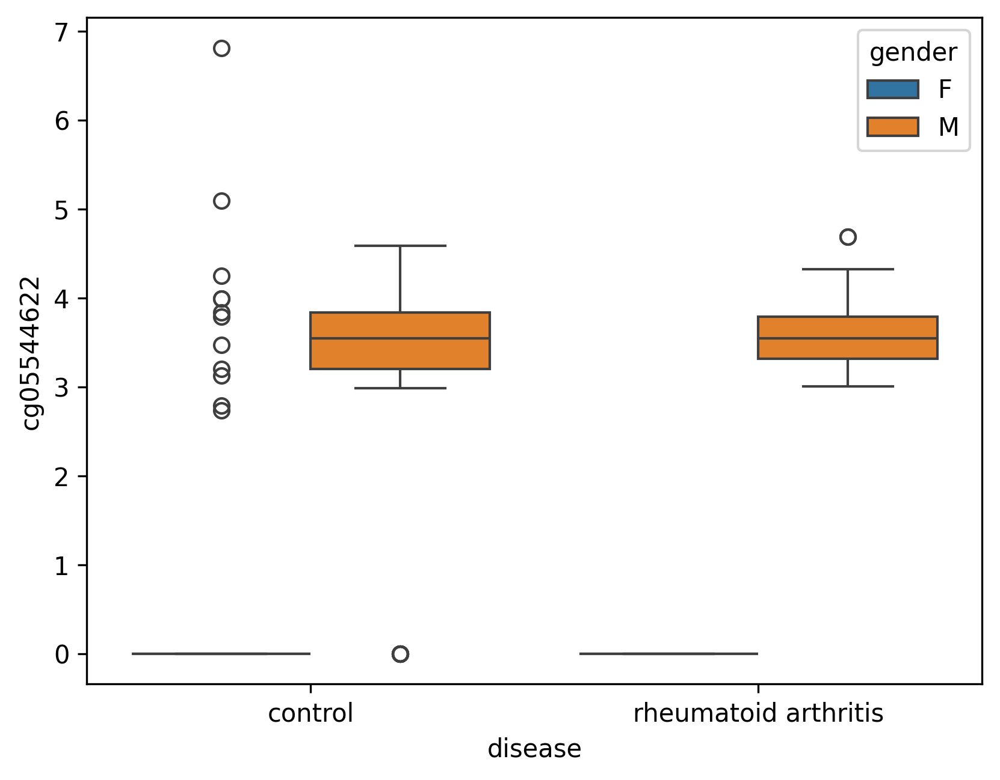

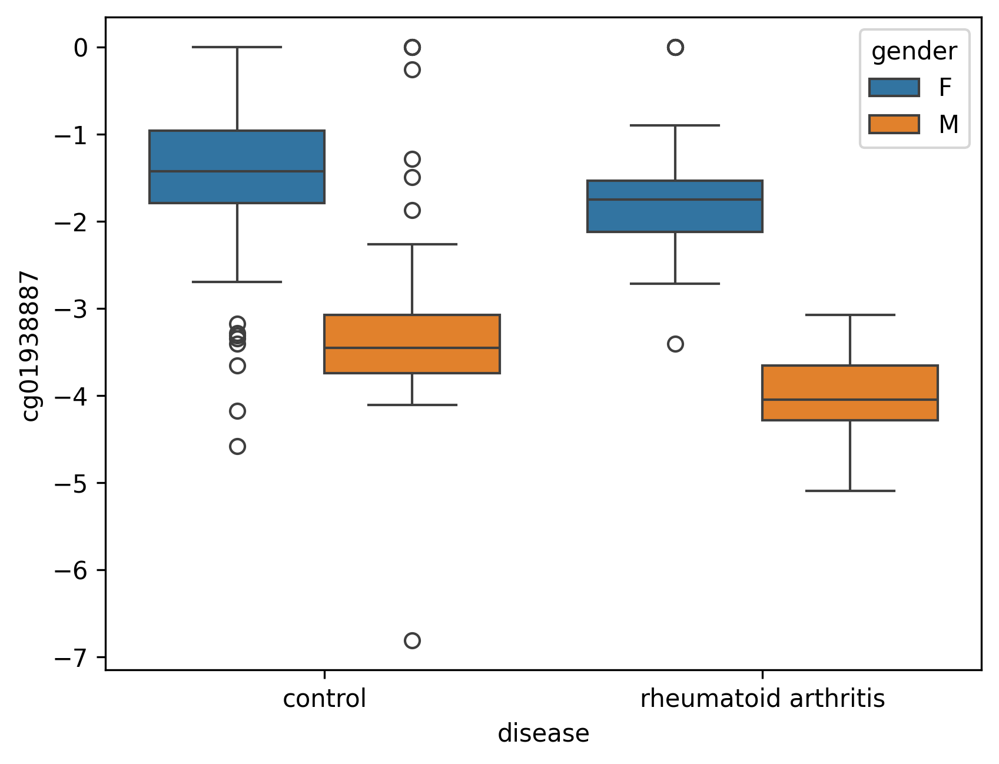

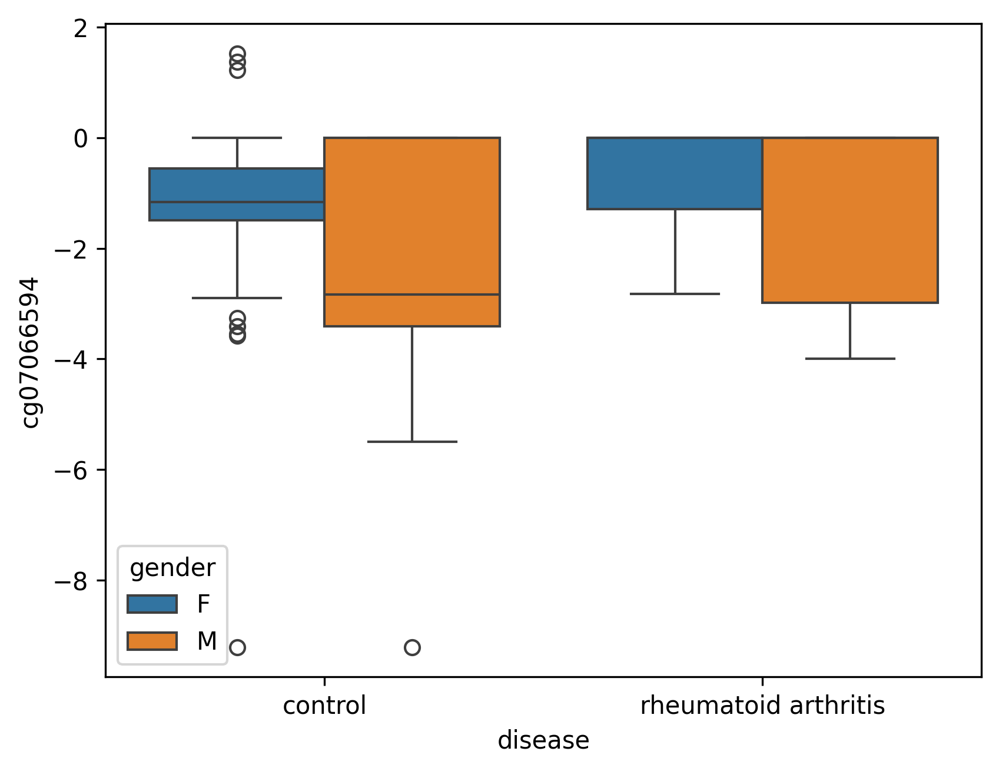

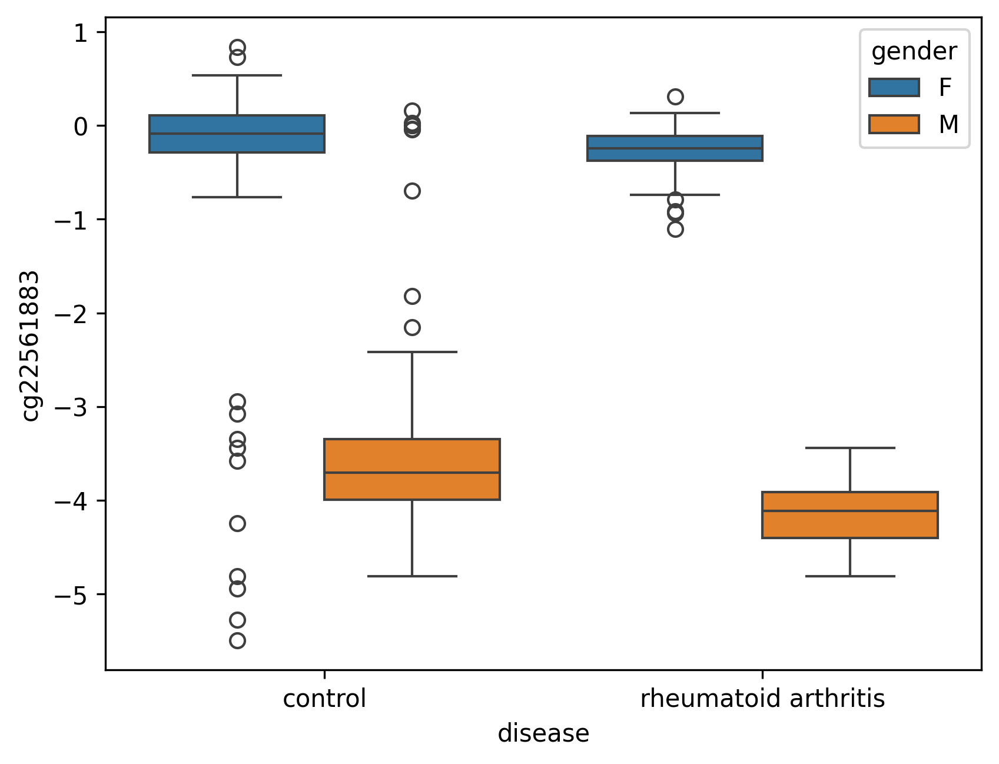

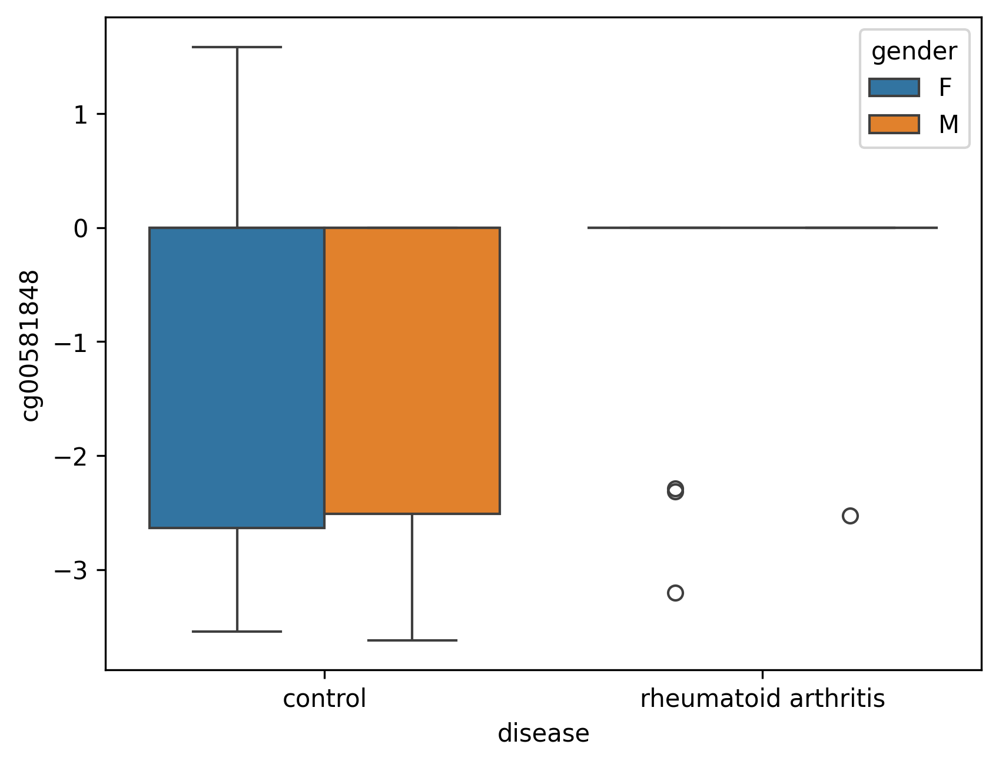

...

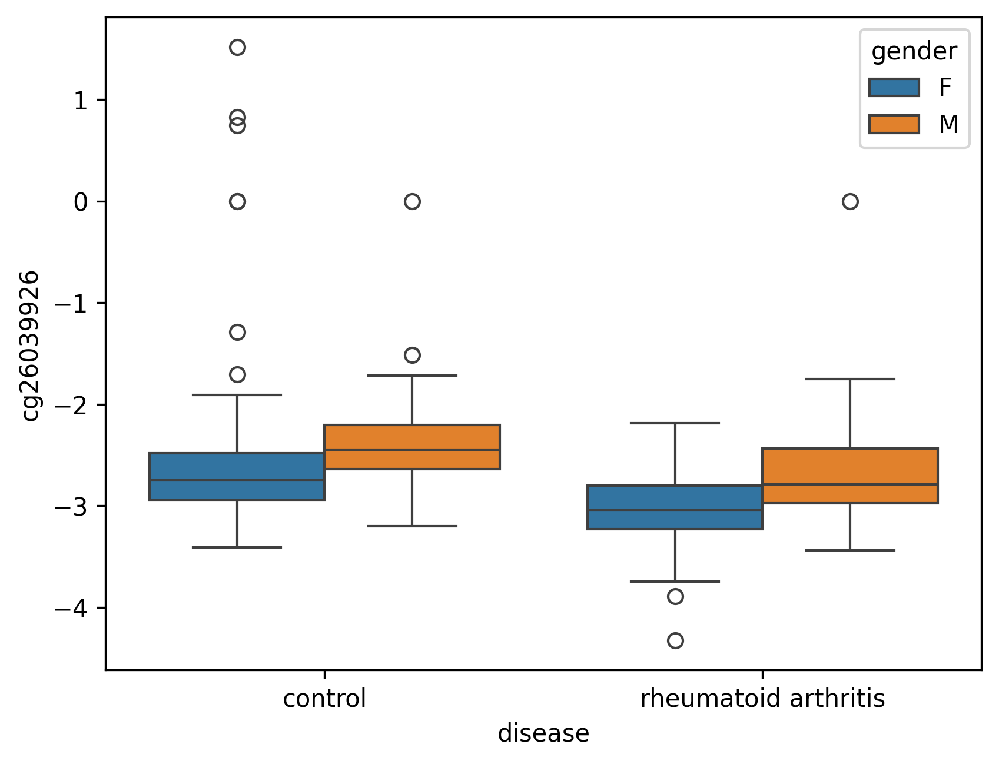

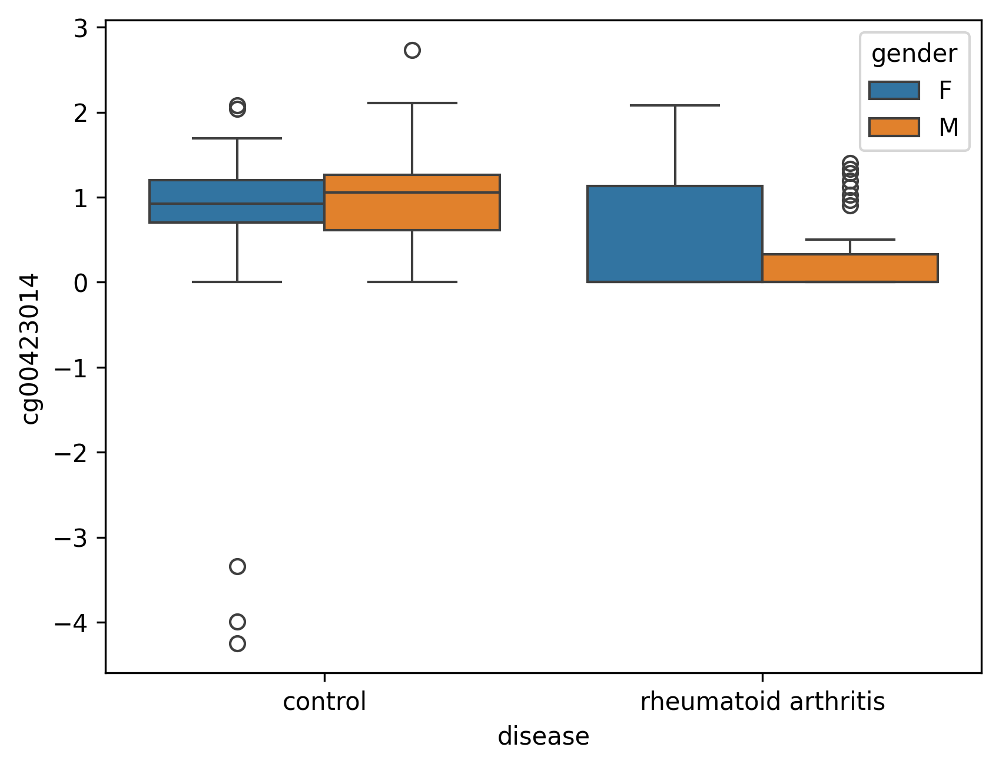

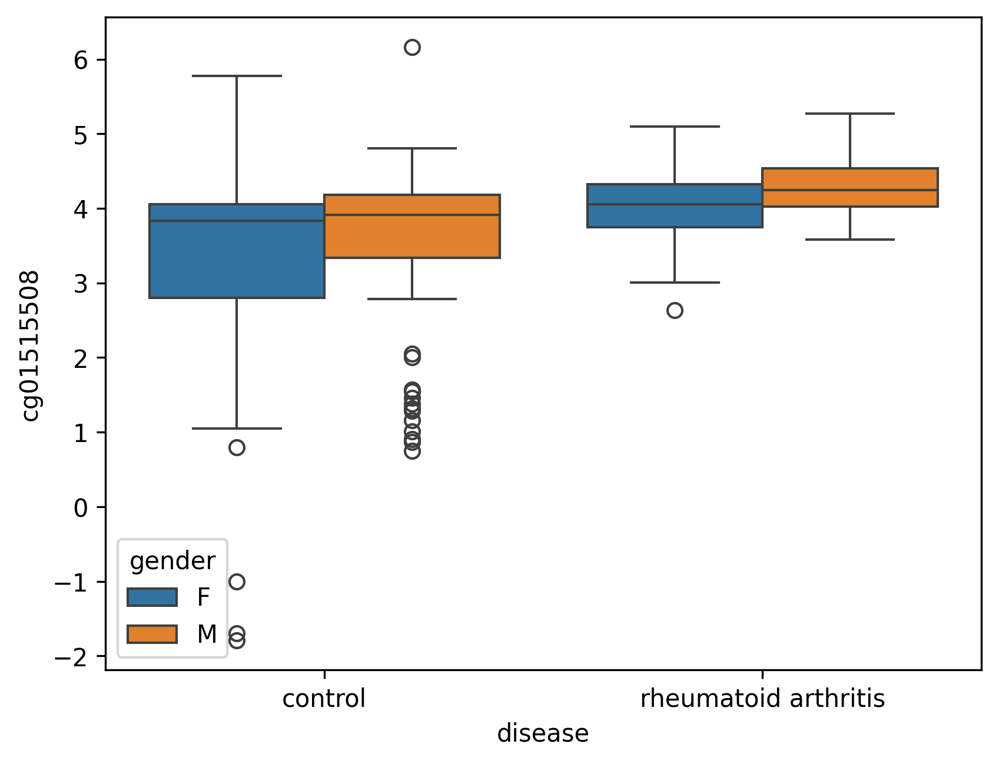

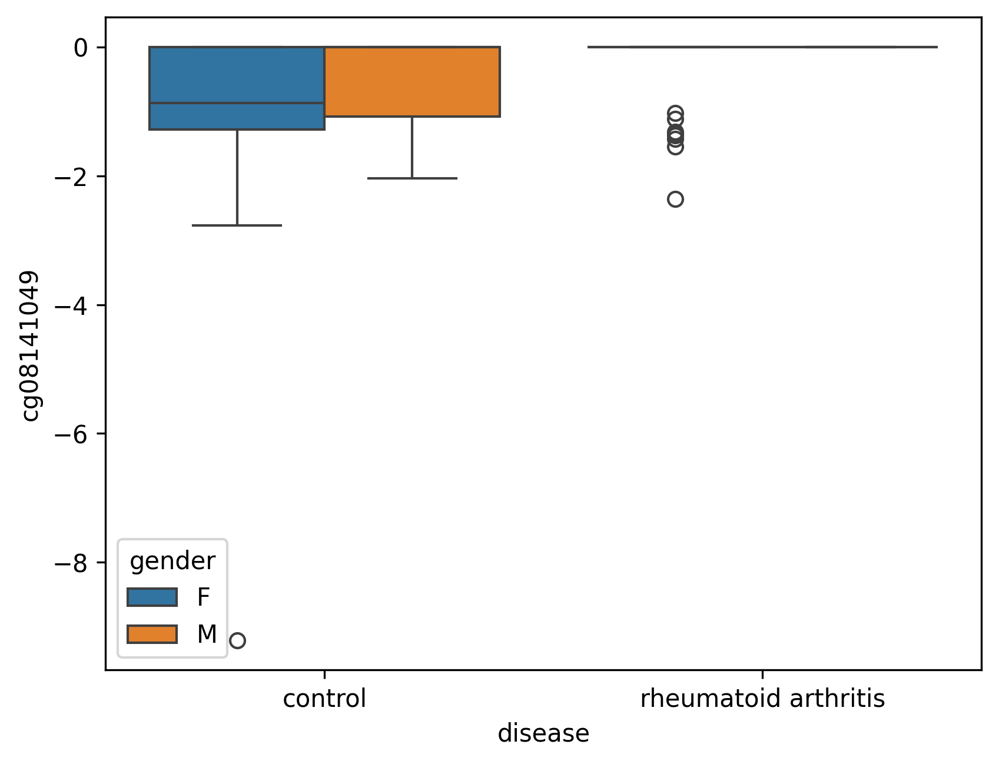

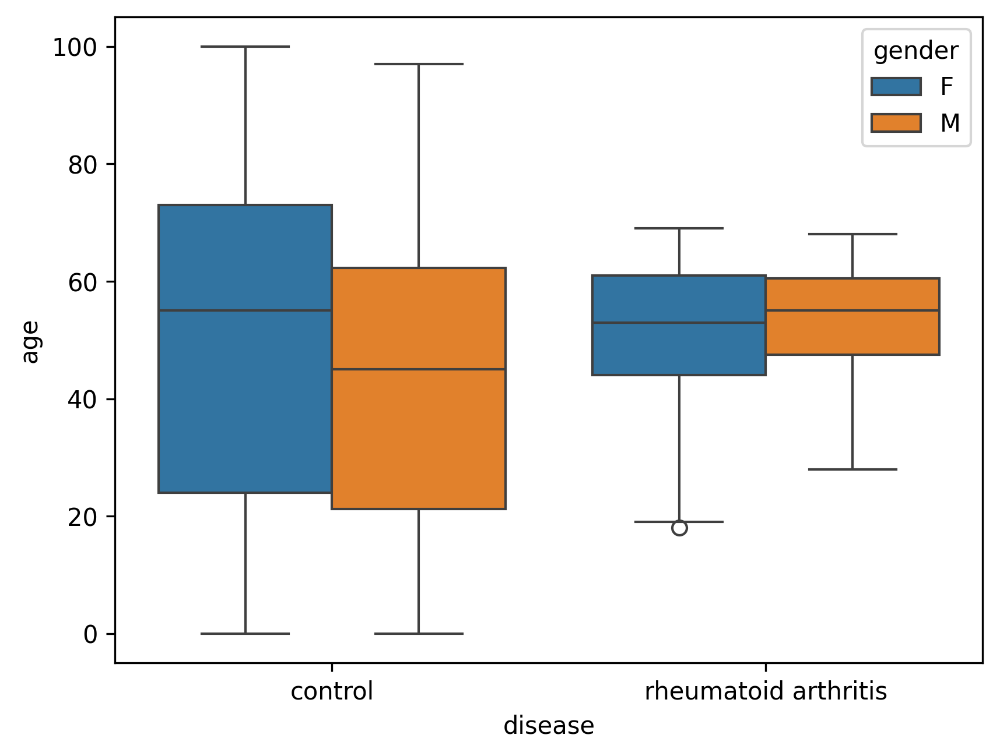

In [143]:
#绘制箱型图
for cg_name in CGList:
    box=plt.figure(dpi=300)
    sns.boxplot(StatsData,x='disease',y=cg_name,hue='gender')
    plt.show()

计算相关性：年龄及其性别数据(cg07066594)的相关性。

<Figure size 1920x1440 with 0 Axes>

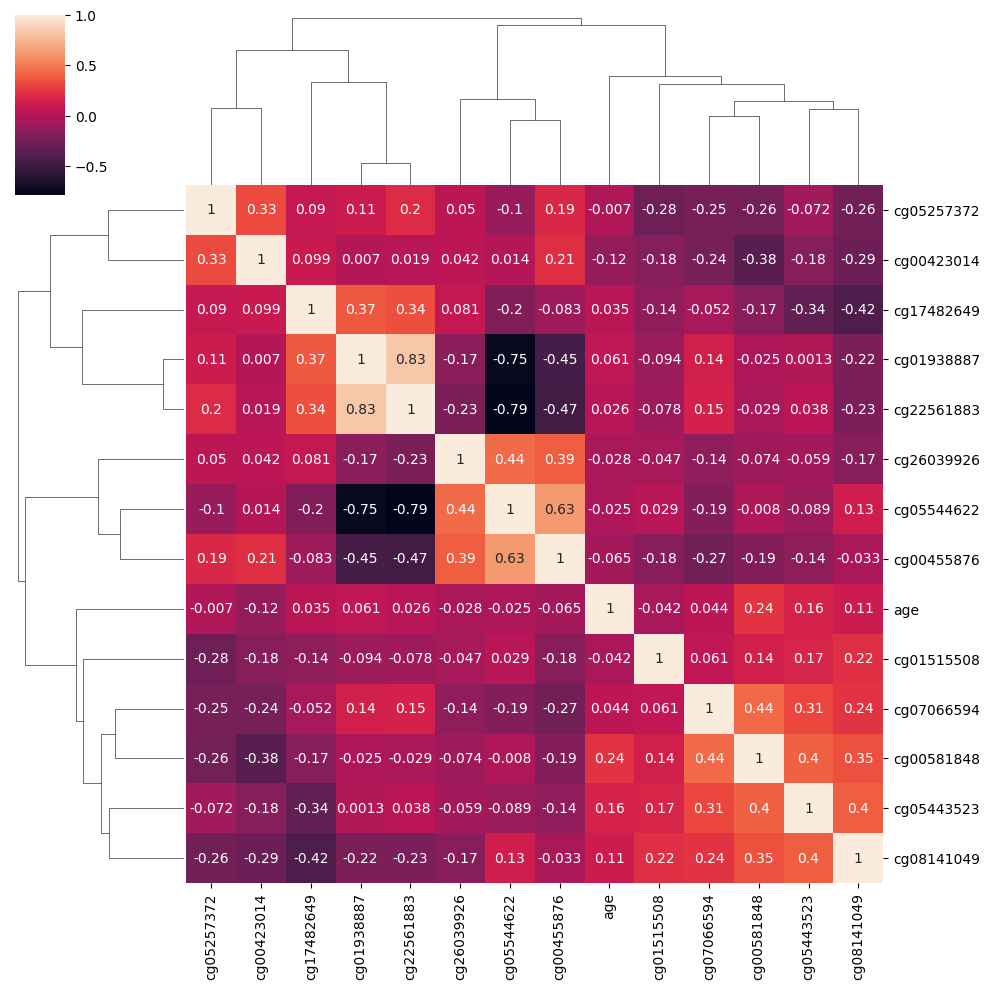

In [156]:
#计算相关性
Spearman=StatsData.loc[:,CGList].corr(method='spearman')
plt.figure(dpi=300)
sns.clustermap(Spearman,annot=True)
plt.show()

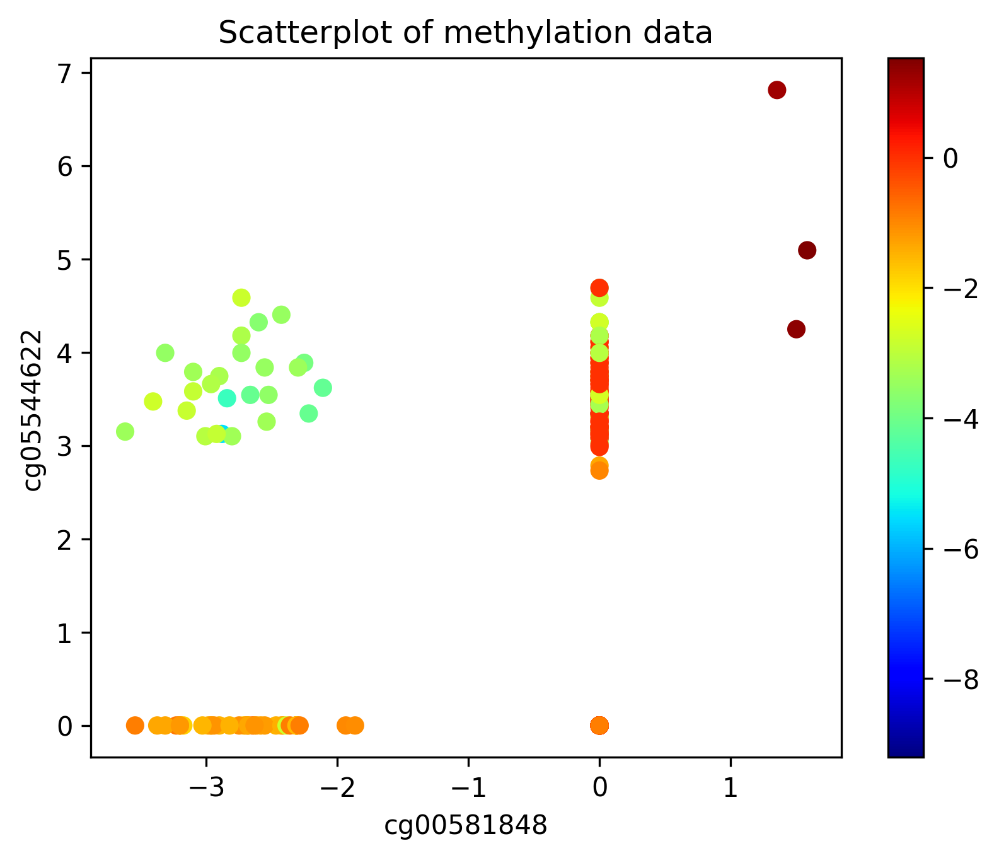

In [163]:
#绘制散点图查看数据分布
Scatter=plt.figure(dpi=300)
StatterAx=Scatter.add_subplot()
StatterAx.set_title('Scatterplot of methylation data')
scatter_plot=StatterAx.scatter(x=StatsData.loc[:,'cg00581848'],y=StatsData.loc[:,'cg05544622'],c=StatsData.loc[:,'cg07066594'],cmap='jet')
StatterAx.set_xlabel('cg00581848')
StatterAx.set_ylabel('cg05544622')
Scatter.colorbar(scatter_plot)
plt.show()

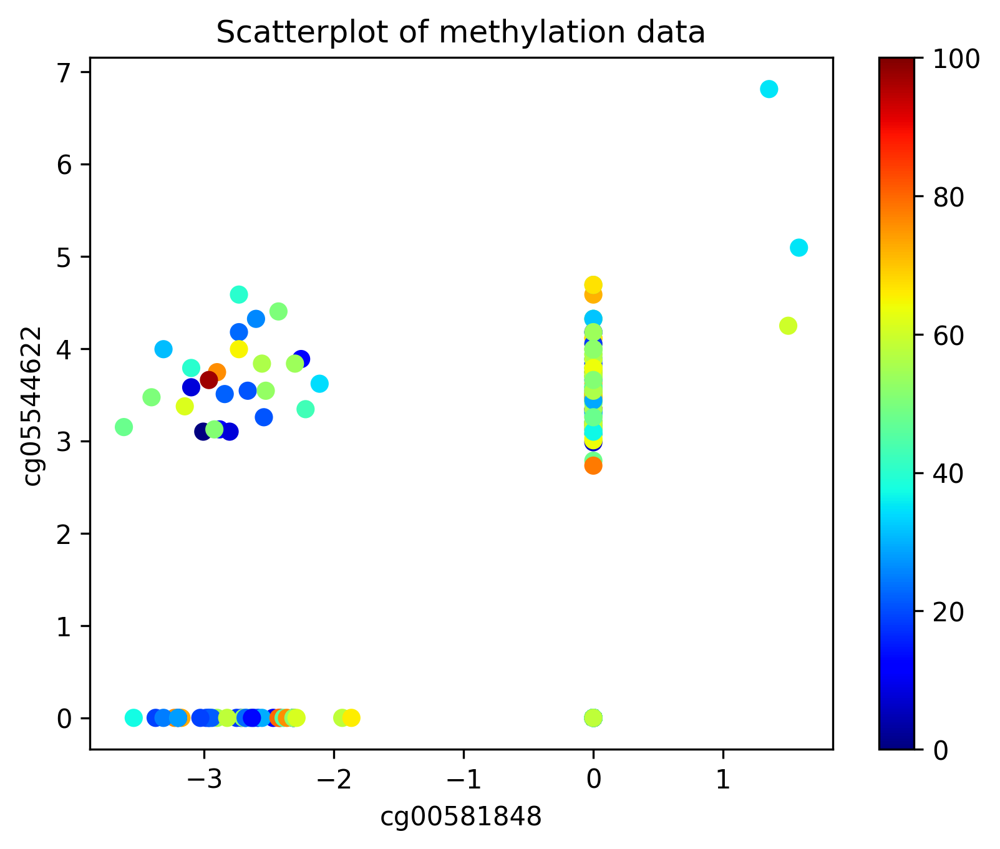

In [164]:
#绘制散点图查看数据分布
Scatter=plt.figure(dpi=300)
StatterAx=Scatter.add_subplot()
StatterAx.set_title('Scatterplot of methylation data')
scatter_plot=StatterAx.scatter(x=StatsData.loc[:,'cg00581848'],y=StatsData.loc[:,'cg05544622'],c=StatsData.loc[:,'age'],cmap='jet')
StatterAx.set_xlabel('cg00581848')
StatterAx.set_ylabel('cg05544622')
Scatter.colorbar(scatter_plot)
plt.show()

In [165]:
#输出统计学结果
StatsData.to_excel('/mnt/workspace/DNA methylation data/RA DNA methylation/StatsRawData.xlsx','UTF-8')
StatsData.to_csv('/mnt/workspace/DNA methylation data/RA DNA methylation/StatsRawData.csv')